https://savetaxfree.co.za/investment-calculator/

http://www.sars.gov.za/TaxTypes/PIT/Pages/Tax%20Free%20Investments.aspx

# Project Objective
------

On 1 March 2015, Tax Free Investments were introduced as an incentive to encourage household savings. Returns earned on these investments are not subject to income tax, dividents tax or capital gains tax and can only be provided by licensed banks, long-term insurers, a manager of registered collective schemes (with certain exceptions), the National Government, a mutual bank or a co-operative bank. 

There are online tools that allow one to estimate their potential returns by specifying risk tolerance, investment term, lump sum and monthly deposit amounts, however it's often a trial and error process whereby you change one parameter at a time in order to see the effect this has on the calculation. 

The objective of this project is to analyse the outcomes of a tax-free investment across all these parameters using generated data which simulates **ALL** possible scenarios. From this we'll be able to visualise the optimal investment strategies for different risk tolerance levels. 

In an ideal world, one would invest the maximum amount each month (as allowed by the investment requirements discussed below) and maximise their returns, however most people cannot do this, hence the need for this analysis. 

# Tax-free Investment Requirements in South Africa

The requirements for tax-free investment in South Africa are as follows (as obtained from [SARS](http://www.sars.gov.za/TaxTypes/PIT/Pages/Tax%20Free%20Investments.aspx)):

- As of 1 March 2017, you can contribute a maximum of R33,000 per tax year. Any portion of unused annual limit is forfeited in that year. 
- There is a life time limit of R500,000 per person. 
- If a person exceeds the limits, there is a penalty of 40% of the excess amount.  Example: Taxpayer X invests R35,000 – exceeded the annual limit by R2,000, 40% of R2,000 = R800 must be paid to SARS. This penalty is added to the normal tax payable on assessment.
- A person can have more than one tax free investment, however, you are limited to the annual limits per tax year. This means you can invest, for example, R11,000 in Old Mutual, R11,000 in Investec and R11,000 in Absa.  
- Parents can invest on behalf of their minor child.  The minor child will use his/her own annual or lifetime limits.
- When returns on investment are added to the capital contributed, the balance may exceed both the annual and/or lifetime limit.  The capitalisation of these returns within the account does not affect the annual or lifetime limit. Example: If you invest R33,000 for the year and receive a return of investment of R5,000, which you have chosen to capitalise, the total amount in the account will be R38,000. The following year, you will still be able to invest your full R33,000 for year.
- However, where a person withdraws the returns and reinvests the same amount, that amount is regarded as a new contribution and impacts on both the annual and lifetime limits. Note that any withdrawals made cannot be replaced, be it returns or capital.
- Tax free investment accounts cannot be used as transactional accounts.
- Debit or stop orders and ATM transactions will not be possible from these accounts.
- Only new accounts will qualify as the idea is to encourage new savings, in other words existing accounts may not be converted.

# Assumptions and Caveats

In order to generate the data and make this as realistic as possible, we'll use the following assumptions:
- Returns will be reinvested into the fund without withdrawal until the maturity date. 
- Low, Interest-Bearing Money Market Funds, 7.21%
- Low-medium, Multi-Asset Low Equity Funds, 9.93%
- Medium, Multi-Asset, average of Medium Equity and High Equity Funds, 12.18%
- Medium high, Equity Top 40 Funds, 16.59%
- High, Equity, Small and Mid-cap Funds, 18%
- Compunding monthly and the end of each investment month.

# Data Generation Process

In [1]:
import numpy as np
import pandas as pd

time_horizons = np.array([i for i in range(1, 51)])
return_rates = np.array([0.0721, 0.0993, 0.1218, 0.1659, 0.18])
lump_sums = np.array([i for i in range(0, 30250, 250)])
monthly_contribs = np.array([i for i in range(0, 5050, 50)])

In [2]:
lump_sums

array([    0,   250,   500,   750,  1000,  1250,  1500,  1750,  2000,
        2250,  2500,  2750,  3000,  3250,  3500,  3750,  4000,  4250,
        4500,  4750,  5000,  5250,  5500,  5750,  6000,  6250,  6500,
        6750,  7000,  7250,  7500,  7750,  8000,  8250,  8500,  8750,
        9000,  9250,  9500,  9750, 10000, 10250, 10500, 10750, 11000,
       11250, 11500, 11750, 12000, 12250, 12500, 12750, 13000, 13250,
       13500, 13750, 14000, 14250, 14500, 14750, 15000, 15250, 15500,
       15750, 16000, 16250, 16500, 16750, 17000, 17250, 17500, 17750,
       18000, 18250, 18500, 18750, 19000, 19250, 19500, 19750, 20000,
       20250, 20500, 20750, 21000, 21250, 21500, 21750, 22000, 22250,
       22500, 22750, 23000, 23250, 23500, 23750, 24000, 24250, 24500,
       24750, 25000, 25250, 25500, 25750, 26000, 26250, 26500, 26750,
       27000, 27250, 27500, 27750, 28000, 28250, 28500, 28750, 29000,
       29250, 29500, 29750, 30000])

In [3]:
monthly_contribs

array([   0,   50,  100,  150,  200,  250,  300,  350,  400,  450,  500,
        550,  600,  650,  700,  750,  800,  850,  900,  950, 1000, 1050,
       1100, 1150, 1200, 1250, 1300, 1350, 1400, 1450, 1500, 1550, 1600,
       1650, 1700, 1750, 1800, 1850, 1900, 1950, 2000, 2050, 2100, 2150,
       2200, 2250, 2300, 2350, 2400, 2450, 2500, 2550, 2600, 2650, 2700,
       2750, 2800, 2850, 2900, 2950, 3000, 3050, 3100, 3150, 3200, 3250,
       3300, 3350, 3400, 3450, 3500, 3550, 3600, 3650, 3700, 3750, 3800,
       3850, 3900, 3950, 4000, 4050, 4100, 4150, 4200, 4250, 4300, 4350,
       4400, 4450, 4500, 4550, 4600, 4650, 4700, 4750, 4800, 4850, 4900,
       4950, 5000])

In [4]:
# will be used by pandas apply() in order to determine if each investment combo is valid. 
def is_valid_investment_params(row):
    time_horizon = row["horizon"]
    lump_sum = row["lump_sum"]
    monthly_contrib = row["monthly"]
    
    periods = time_horizon * 12
    
    # not allowed to contribute more than R33,000 per year, so lump sum on its own cannot be greater than this amount.
    if lump_sum > 33000:
        return False
    
    # total lifetime contributions cannot be greater than R500,000, so let's check that.
    if (lump_sum + periods*monthly_contrib) > 500000:
        return False

    # if the contributions in a single year + the lump sum exceed 33,000, reject the investment option.
    yearly_total = lump_sum
    total = yearly_total
    for i in range(1, int(periods)+1):
        yearly_total = yearly_total + monthly_contrib
        total = total + monthly_contrib
        
        if (yearly_total > 33000) or (total > 500000):
            return False
        
        if i % 12 == 0:
            yearly_total = 0
    return True

In [5]:
# numpy meshgrid allows us to create a matrix of all combinations of our input arrays
investment_options = np.stack(np.meshgrid(time_horizons, return_rates, lump_sums, monthly_contribs), -1).reshape(-1, 4)

df = pd.DataFrame(investment_options, columns=["horizon", "rate", "lump_sum", "monthly"])
df.horizon = df.horizon.astype("int64")
df.lump_sum = df.lump_sum.astype("int64")
df.monthly = df.monthly.astype("int64")

In [2]:
def assign_risk(col):
    if col == 0.0721: return 'low'
    if col == 0.0993: return 'low-medium'
    if col == 0.1218: return 'medium'
    if col == 0.1659: return 'medium-high'
    if col == 0.18: return 'high'
    
df["risk"] = df["rate"].apply(assign_risk)

NameError: name 'df' is not defined

In [1]:
df.info()

NameError: name 'df' is not defined

In [9]:
# adding too column which indicates whether this combo of params is a valid tax-free investment
df["valid"] = df.apply(is_valid_investment_params, axis=1)   

# calculaing the future value using numpy fv() 
df["fv"] = -np.round(np.fv(df["rate"]/12, nper=df["horizon"]*12, pmt=df["monthly"], pv=df["lump_sum"], when='end'), 2)

In [ ]:
df.head()

In [10]:
df.to_csv('taxfree_investment_options.csv', index=False)

# Data Preparation

In [11]:
data_orig = pd.read_csv('taxfree_investment_options.csv')
data_orig.shape

(3055250, 7)

In [12]:
data_orig.sample(15)

,horizon,rate,lump_sum,monthly,risk,valid,fv
2541226,8,0.1800,28250,3300,high,False,8.166432e+05
198063,17,0.0721,6250,100,low,True,6.105897e+04
2181641,29,0.1659,15500,2050,medium-high,False,1.932276e+07
1503953,24,0.1218,1750,3150,medium,False,5.409926e+06
2187962,30,0.1659,750,5000,medium-high,False,5.044062e+07
1443670,19,0.1218,3750,3850,medium,False,3.451099e+06
905743,25,0.0993,3250,3800,low-medium,False,5.020755e+06
622073,1,0.0993,27250,700,low-medium,False,3.887559e+04
1567068,29,0.1218,6750,2650,medium,False,8.736946e+06
2377361,45,0.1659,16000,1150,medium-high,False,1.645259e+08


In [13]:
data_orig.describe()

,horizon,rate,lump_sum,monthly,fv
count,3.055250e+06,3.055250e+06,3.055250e+06,3.055250e+06,3.055250e+06
mean,2.550000e+01,1.278200e-01,1.500000e+04,2.500000e+03,5.956524e+07
std,1.443087e+01,4.031672e-02,8.732126e+03,1.457738e+03,1.985320e+08
min,1.000000e+00,7.210000e-02,0.000000e+00,0.000000e+00,-0.000000e+00
25%,1.300000e+01,9.930000e-02,7.500000e+03,1.250000e+03,7.326591e+05
50%,2.550000e+01,1.218000e-01,1.500000e+04,2.500000e+03,4.012488e+06
75%,3.800000e+01,1.659000e-01,2.250000e+04,3.750000e+03,2.197387e+07
max,5.000000e+01,1.800000e-01,3.000000e+04,5.000000e+03,2.753455e+09


## Adding Binned Categorical Variables

In [14]:
labels = ["2 Years", "5 Years", "10 Years", "15 Years", "20 Years", "30 Years", "40 Years", "50 Years"]
bins = [0, 2, 5, 10, 15, 20, 30, 40, 50]
data_orig["horizon_cat"] = pd.cut(data_orig.horizon, bins=bins, labels=labels)
print(data_orig.horizon_cat.isnull().sum())

0


In [15]:
data_orig.horizon_cat.value_counts()

50 Years    611050
40 Years    611050
30 Years    611050
20 Years    305525
15 Years    305525
10 Years    305525
5 Years     183315
2 Years     122210
Name: horizon_cat, dtype: int64

In [16]:
labels=["0-R5K", "R5K-R10K", "R10K-R15K", "R15K-20K", "R20K-R25K", "R25K-R30K"]
data_orig["lump_sum_cat"] = pd.qcut(data_orig.lump_sum, 6, labels=labels)
print(data_orig.lump_sum_cat.isnull().sum())
data_orig.lump_sum_cat.value_counts()

0


0-R5K        530250
R25K-R30K    505000
R20K-R25K    505000
R15K-20K     505000
R10K-R15K    505000
R5K-R10K     505000
Name: lump_sum_cat, dtype: int64

In [17]:
labels=["0-R500", "R500-R1K", "R1K-R1.5K", "R1.5K-R2K", "R2K-R2.5K", "R2.5K-R3K", "R3K-R3.5K", "R3.5K-R4K", "R4.5K-R5K"]
data_orig["monthly_cat"] = pd.qcut(data_orig.monthly, 9, labels=labels)
print(data_orig.monthly_cat.isnull().sum())
#data_orig.monthly_cat = data_orig.monthly_cat.astype(str)
data_orig.monthly_cat.value_counts()

0


R2K-R2.5K    363000
0-R500       363000
R4.5K-R5K    332750
R3.5K-R4K    332750
R3K-R3.5K    332750
R2.5K-R3K    332750
R1.5K-R2K    332750
R1K-R1.5K    332750
R500-R1K     332750
Name: monthly_cat, dtype: int64

In [18]:
data_orig.head()

,horizon,rate,lump_sum,monthly,risk,valid,fv,horizon_cat,lump_sum_cat,monthly_cat
0,1,0.0721,0,0,low,True,-0.00,2 Years,0-R5K,0-R500
1,1,0.0721,0,50,low,True,620.23,2 Years,0-R5K,0-R500
2,1,0.0721,0,100,low,True,1240.46,2 Years,0-R5K,0-R500
3,1,0.0721,0,150,low,True,1860.69,2 Years,0-R5K,0-R500
4,1,0.0721,0,200,low,True,2480.92,2 Years,0-R5K,0-R500


In [19]:
data_invalid = data_orig[data_orig.valid==False]
data = data_orig[data_orig.valid==True]
print(data_invalid.shape, data.shape)

(2310825, 10) (744425, 10)


In [20]:
data.head(15)

,horizon,rate,lump_sum,monthly,risk,valid,fv,horizon_cat,lump_sum_cat,monthly_cat
0,1,0.0721,0,0,low,True,-0.00,2 Years,0-R5K,0-R500
1,1,0.0721,0,50,low,True,620.23,2 Years,0-R5K,0-R500
2,1,0.0721,0,100,low,True,1240.46,2 Years,0-R5K,0-R500
3,1,0.0721,0,150,low,True,1860.69,2 Years,0-R5K,0-R500
4,1,0.0721,0,200,low,True,2480.92,2 Years,0-R5K,0-R500
5,1,0.0721,0,250,low,True,3101.15,2 Years,0-R5K,0-R500
6,1,0.0721,0,300,low,True,3721.38,2 Years,0-R5K,0-R500
7,1,0.0721,0,350,low,True,4341.61,2 Years,0-R5K,0-R500
8,1,0.0721,0,400,low,True,4961.84,2 Years,0-R5K,0-R500
9,1,0.0721,0,450,low,True,5582.07,2 Years,0-R5K,0-R500


In [21]:
data.duplicated().sum()

0

In [22]:
data.lump_sum_cat.value_counts()

0-R5K        185240
R5K-R10K     161080
R10K-R15K    142670
R15K-20K     119730
R20K-R25K     88205
R25K-R30K     47500
Name: lump_sum_cat, dtype: int64

In [23]:
data.monthly_cat.value_counts()

0-R500       349750
R500-R1K     231400
R1K-R1.5K    106230
R1.5K-R2K     45375
R2K-R2.5K     11670
R4.5K-R5K         0
R3.5K-R4K         0
R3K-R3.5K         0
R2.5K-R3K         0
Name: monthly_cat, dtype: int64

# Exploratory Data Analysis

In [24]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
import seaborn as sns
%matplotlib inline
plt.style.use('fivethirtyeight')

plt.rcParams['axes.labelsize'] = 16
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['figure.dpi'] = 400

def currency_formatter(x, pos):
    if x > 900000:
        return 'R%1.1fM' % (x * 1e-6)
    elif x < 1000:
        return 'R%1.1d' % (x)
    else:
        return 'R%1.1dK' % (x * 1e-3) 
    
axes_formatter = FuncFormatter(currency_formatter)    

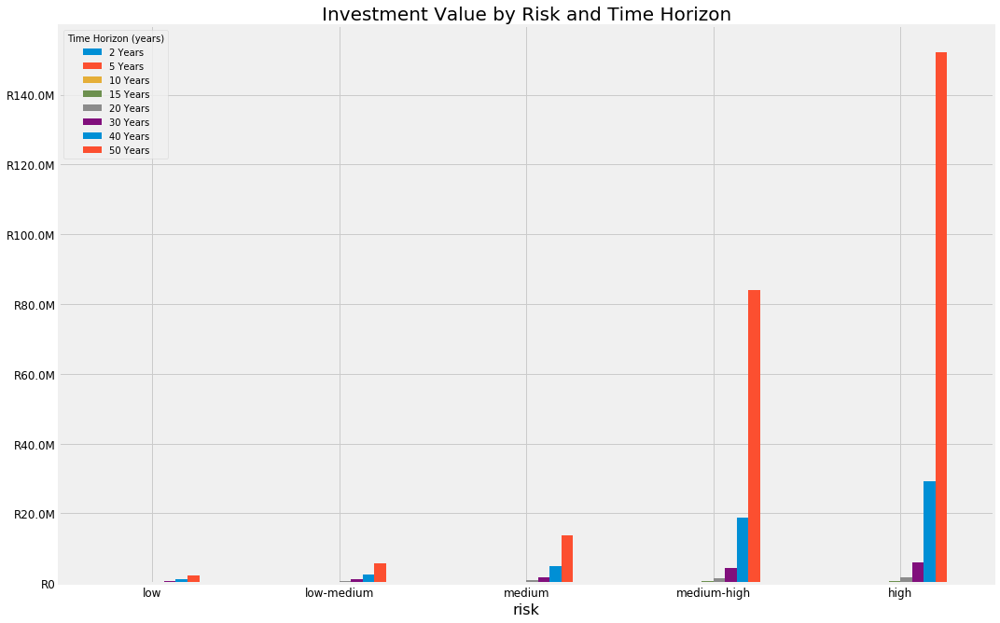

In [25]:
df = pd.pivot_table(data, index="risk", columns="horizon_cat", values="fv")
df = df.reindex(['low', 'low-medium', 'medium', 'medium-high', 'high'], axis=0)
ax = df.plot.bar(figsize=(16,11), title="Investment Value by Risk and Time Horizon")
plt.xticks(rotation=0)
ax.yaxis.set_major_formatter(axes_formatter)
ax.legend(title="Time Horizon (years)")

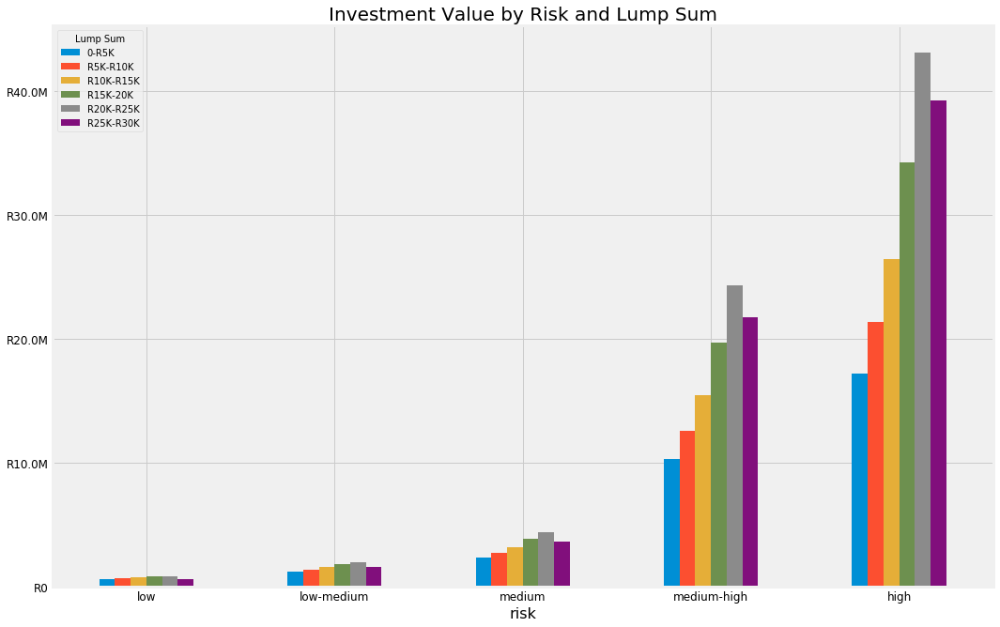

In [26]:
df = pd.pivot_table(data, index="risk", columns="lump_sum_cat", values="fv")
df = df.reindex(['low', 'low-medium', 'medium', 'medium-high', 'high'], axis=0)
ax = df.plot.bar(figsize=(16,11), title="Investment Value by Risk and Lump Sum")
plt.xticks(rotation=0)
ax.yaxis.set_major_formatter(axes_formatter)
ax.legend(title="Lump Sum")

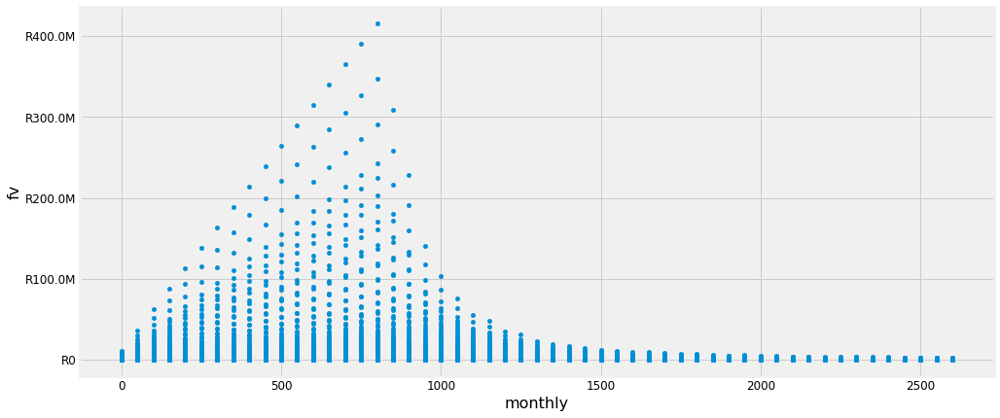

In [27]:
ax = data[data.lump_sum == 1500].plot.scatter(x="monthly", y="fv", figsize=(15,7))
ax.yaxis.set_major_formatter(axes_formatter)
#plt.xticks(rotation=0)

In [28]:
data[data.horizon==18].pivot_table(index="monthly_cat", columns = "lump_sum_cat", values="fv")#[["None", "1000-1499"]]#.plot.bar(figsize=(12, 7))
#ax.yaxis.set_major_formatter(formatter)
#plt.xticks(rotation=0)

lump_sum_cat,0-R5K,R5K-R10K,R10K-R15K,R15K-20K,R20K-R25K,R25K-R30K
monthly_cat,,,,,,
0-R500,2.919349e+05,3.562755e+05,4.190468e+05,4.818181e+05,544589.438550,552431.008364
R500-R1K,8.367197e+05,9.010603e+05,9.638316e+05,1.025385e+06,983567.821453,888604.798667
R1K-R1.5K,1.357818e+06,1.422159e+06,1.467199e+06,1.390269e+06,NaN,NaN
R1.5K-R2K,1.878917e+06,1.894075e+06,1.798925e+06,NaN,NaN,NaN
R2K-R2.5K,2.176465e+06,2.202384e+06,NaN,NaN,NaN,NaN


# Goal 1: Savings for Child's University Education
- 18 years time

In [29]:
data_18yrs_lump10k_monthly500 = data[(data.horizon==18) & (data.lump_sum == 10000) & (data.monthly==500)]

In [30]:
data_18yrs_lump10k_monthly500.head()

,horizon,rate,lump_sum,monthly,risk,valid,fv,horizon_cat,lump_sum_cat,monthly_cat
211807,18,0.0721,10000,500,low,True,256751.41,20 Years,R5K-R10K,0-R500
822857,18,0.0993,10000,500,low-medium,True,357193.95,20 Years,R5K-R10K,0-R500
1433907,18,0.1218,10000,500,medium,True,475687.92,20 Years,R5K-R10K,0-R500
2044957,18,0.1659,10000,500,medium-high,True,859884.97,20 Years,R5K-R10K,0-R500
2656007,18,0.1800,10000,500,high,True,1046824.51,20 Years,R5K-R10K,0-R500


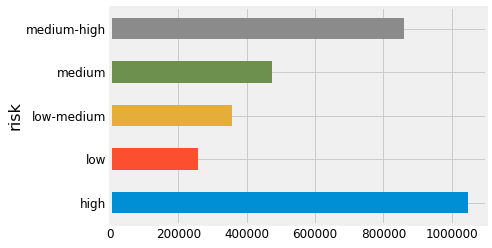

In [31]:
data_18yrs_lump10k_monthly500.groupby('risk').mean()["fv"].plot.barh()

(array([0, 1, 2, 3, 4]), <a list of 5 Text xticklabel objects>)

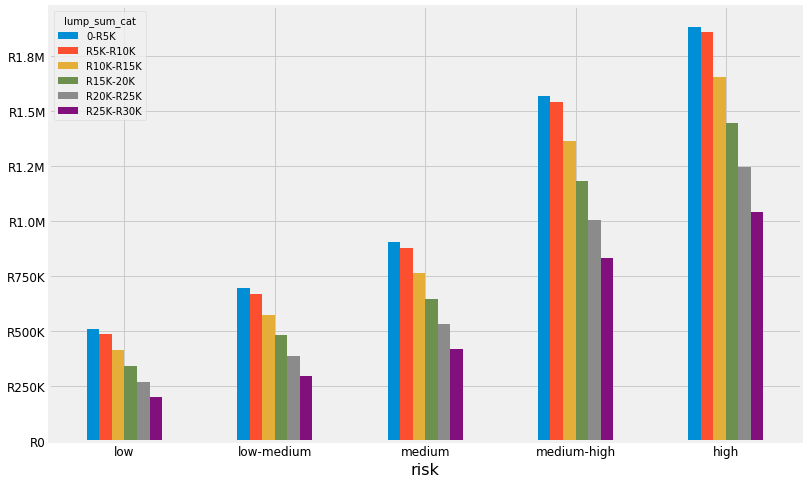

In [32]:
ax = data[data.horizon==18].pivot_table(index="risk", columns="lump_sum_cat", values="fv").reindex(["low", "low-medium", "medium", "medium-high", "high"]).plot.bar(figsize=(12,8))
ax.yaxis.set_major_formatter(axes_formatter)
plt.xticks(rotation=0)

- Why is 10-30K lump sum earning less over time. liitation of 33K per year limits how much you can put in monthly, which limits compound interest effect. 


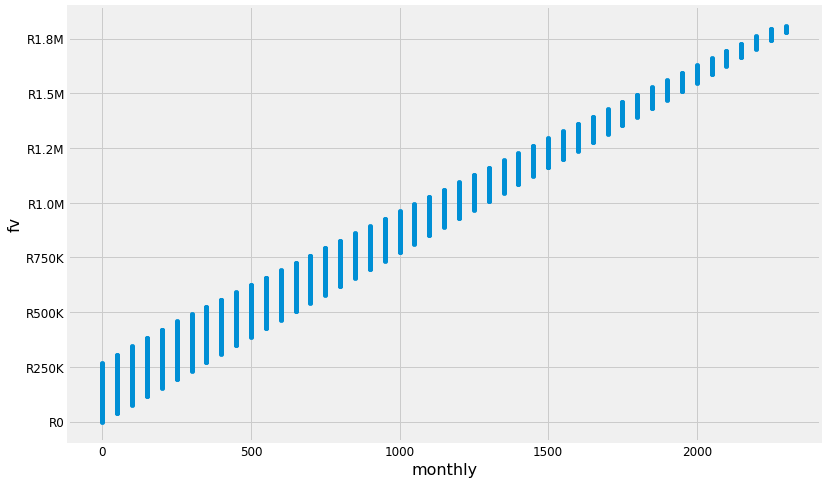

In [33]:
ax = data[(data.horizon==18) & (data.risk=="medium")].plot(kind="scatter", x="monthly", y="fv", figsize=(12,8))
ax.yaxis.set_major_formatter(axes_formatter)

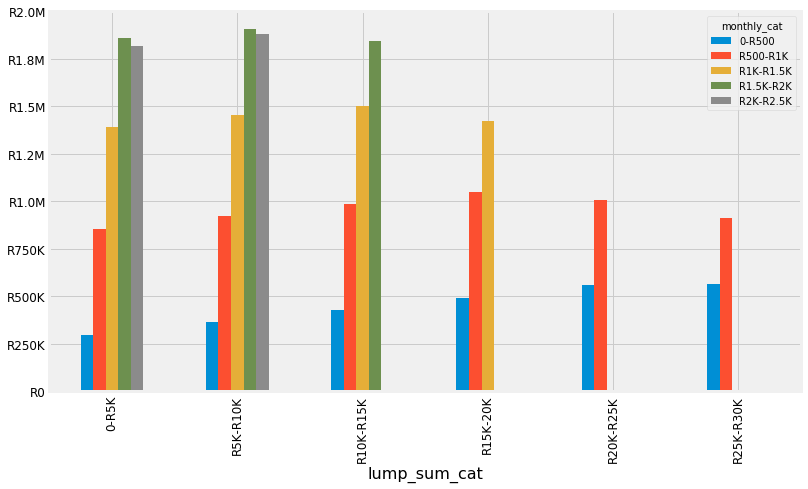

In [34]:
ax = data[data.horizon_cat=="20 Years"].pivot_table(index="lump_sum_cat", columns="monthly_cat", values="fv").plot.bar(figsize=(12, 7))
ax.yaxis.set_major_formatter(axes_formatter)

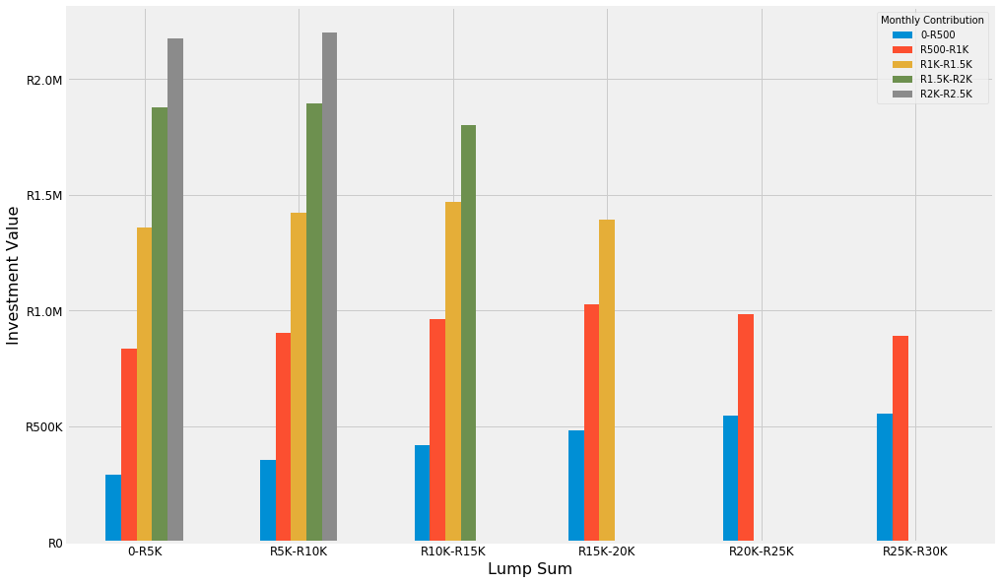

In [35]:
ax = data[data.horizon==18].pivot_table(index="lump_sum_cat", columns="monthly_cat", values="fv").plot.bar(figsize=(15, 10))
ax.yaxis.set_major_formatter(axes_formatter)
plt.xticks(rotation=0)
ax.set_xlabel("Lump Sum")
ax.set_ylabel("Investment Value")
ax.legend(title="Monthly Contribution")

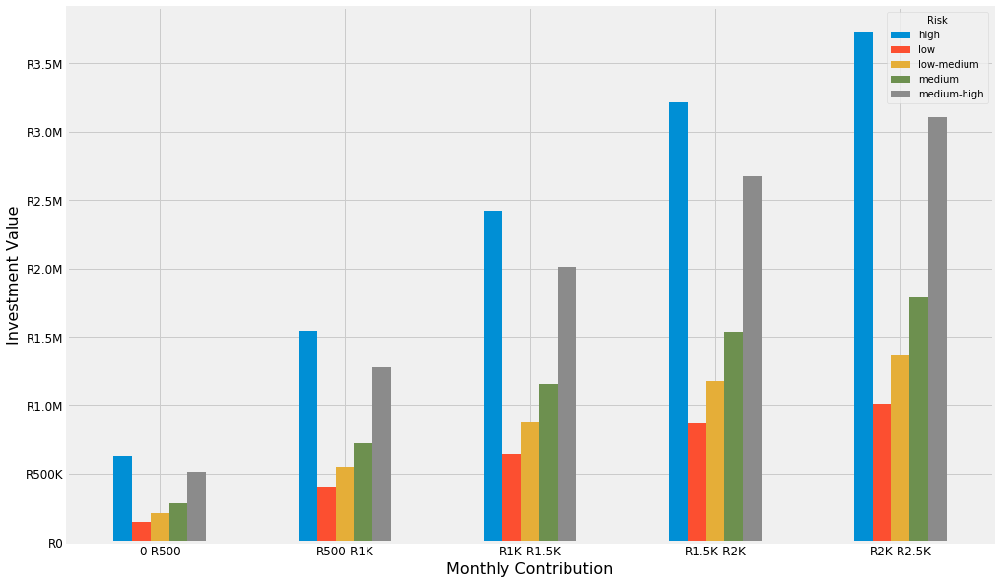

In [36]:
ax = data[(data.horizon==18) & (data.lump_sum_cat=="R5K-R10K")].pivot_table(index="monthly_cat", columns="risk", values="fv").plot.bar(figsize=(15, 10))
ax.yaxis.set_major_formatter(axes_formatter)
plt.xticks(rotation=0)
ax.set_xlabel("Monthly Contribution")
ax.set_ylabel("Investment Value")
ax.legend(title="Risk")

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]),
 <a list of 50 Text xticklabel objects>)

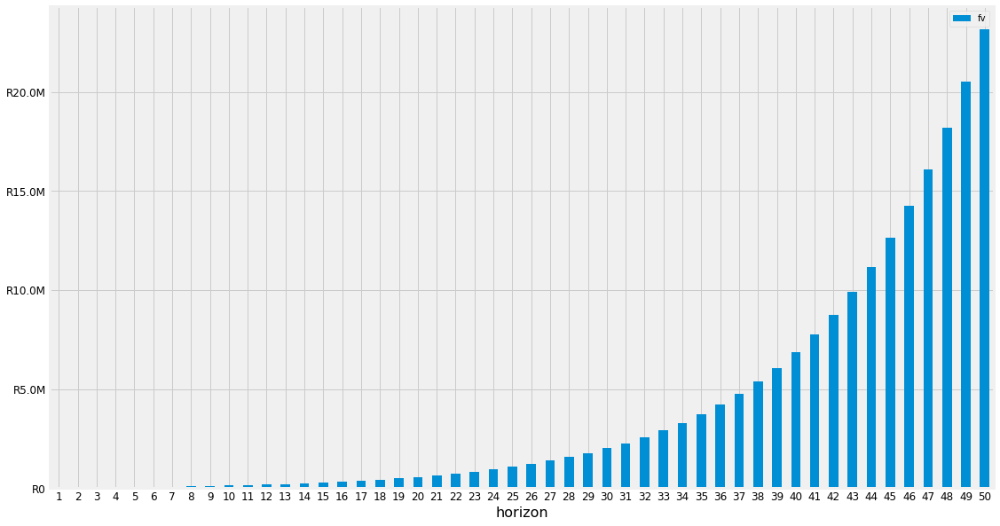

In [37]:
ax = data[(data.monthly==500) & (data.lump_sum==5000) & (data.risk=="medium")].pivot_table(index="horizon", values="fv").plot.bar(figsize=(17, 10))
ax.yaxis.set_major_formatter(axes_formatter)
plt.xticks(rotation=0)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]),
 <a list of 50 Text xticklabel objects>)

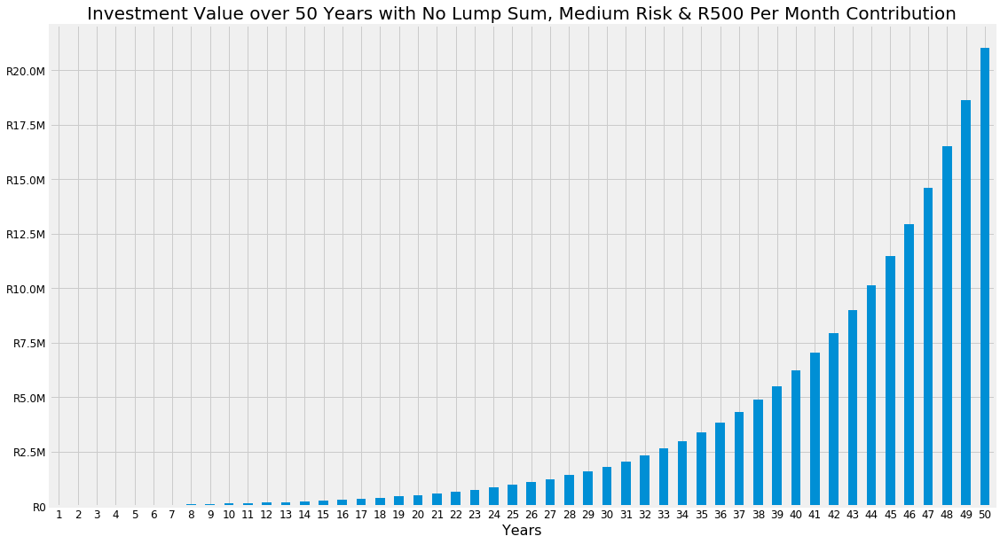

In [38]:
width, height = plt.figaspect(1.68)
ax = data[(data.monthly==500) & (data.lump_sum==0) & (data.risk=="medium")].pivot_table(index="horizon", values="fv").plot.bar(figsize=(17, 10), legend=False)
ax.set_xlabel("Years")
ax.set_title("Investment Value over 50 Years with No Lump Sum, Medium Risk & R500 Per Month Contribution")
ax.yaxis.set_major_formatter(axes_formatter)
plt.xticks(rotation=0)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17]), <a list of 18 Text xticklabel objects>)

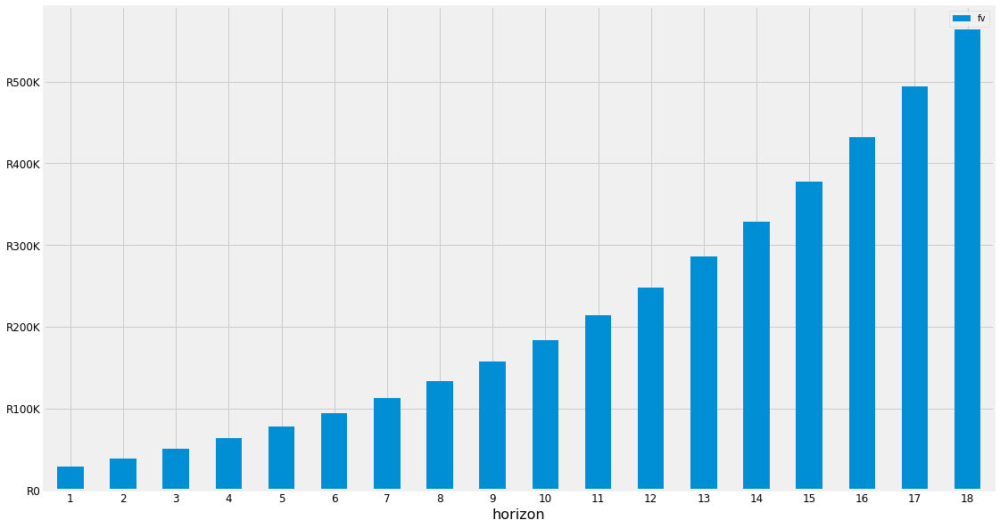

In [39]:
ax = data[(data.monthly==500) & (data.lump_sum==20000) & (data.risk=="medium") & (data.horizon < 19)].pivot_table(index="horizon", values="fv").plot.bar(figsize=(17, 10))
ax.yaxis.set_major_formatter(axes_formatter)
plt.xticks(rotation=0)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17]), <a list of 18 Text xticklabel objects>)

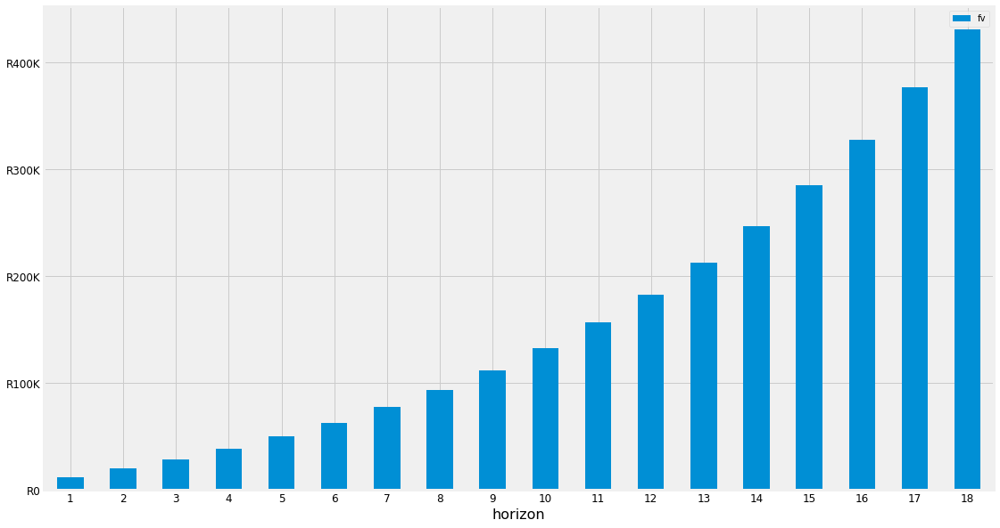

In [40]:
ax = data[(data.monthly==500) & (data.lump_sum==5000) & (data.risk=="medium") & (data.horizon < 19)].pivot_table(index="horizon", values="fv").plot.bar(figsize=(17, 10))
ax.yaxis.set_major_formatter(axes_formatter)
plt.xticks(rotation=0)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17]), <a list of 18 Text xticklabel objects>)

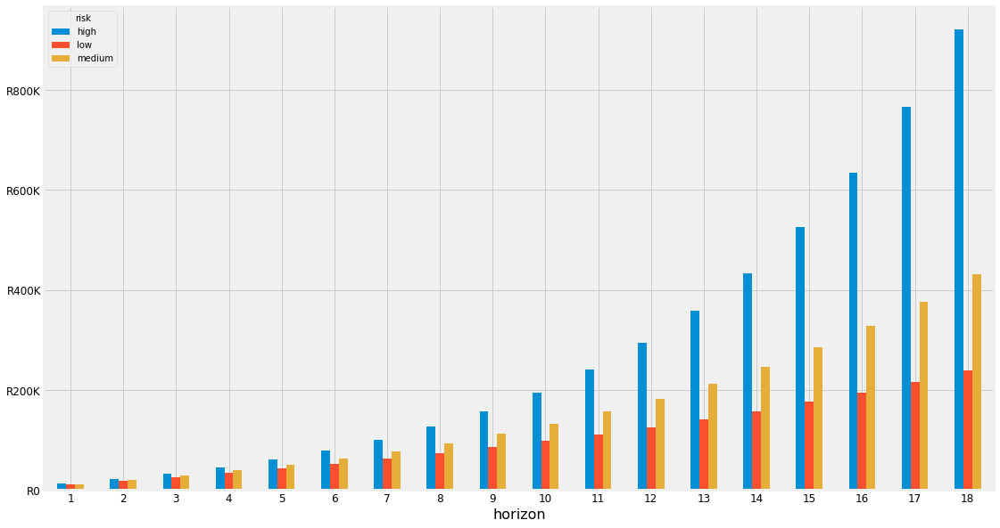

In [41]:
df = data[(data.monthly==500) & (data.lump_sum==5000) & ((data.risk == "low") | (data.risk == "medium") | (data.risk == "high")) & (data.horizon < 19)]
#df.pivot_table(index="horizon", values="fv", columns="risk")
#df.reindex(['low', 'medium', 'high'], axis=1)
ax = df.pivot_table(index="horizon", values="fv", columns="risk").plot.bar(figsize=(17, 10))
ax.yaxis.set_major_formatter(axes_formatter)
plt.xticks(rotation=0)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20]), <a list of 21 Text xticklabel objects>)

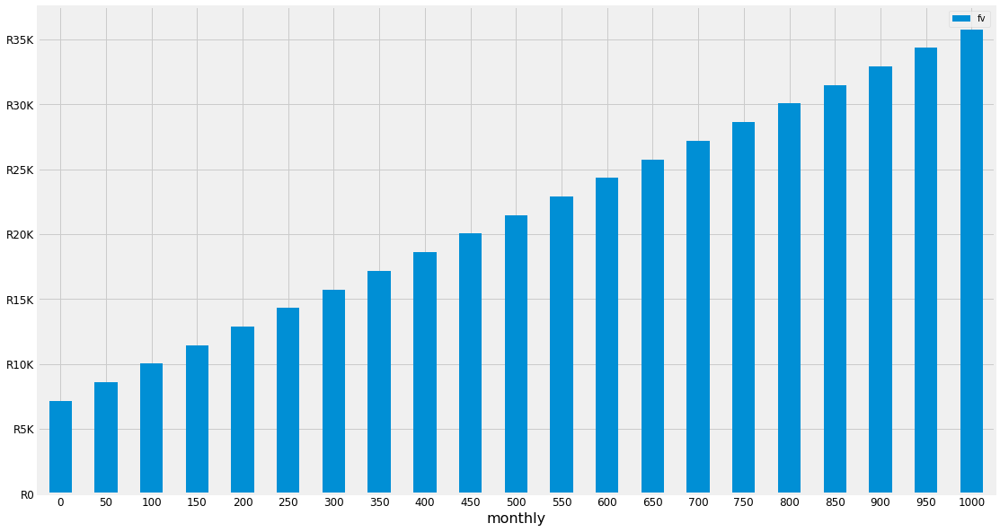

In [42]:
df = data[(data.monthly < 1050) & (data.lump_sum==5000) & (data.risk == "high") & (data.horizon == 2)]
ax = df.pivot_table(index="monthly", values="fv").plot.bar(figsize=(17, 10))
ax.yaxis.set_major_formatter(axes_formatter)
plt.xticks(rotation=0)

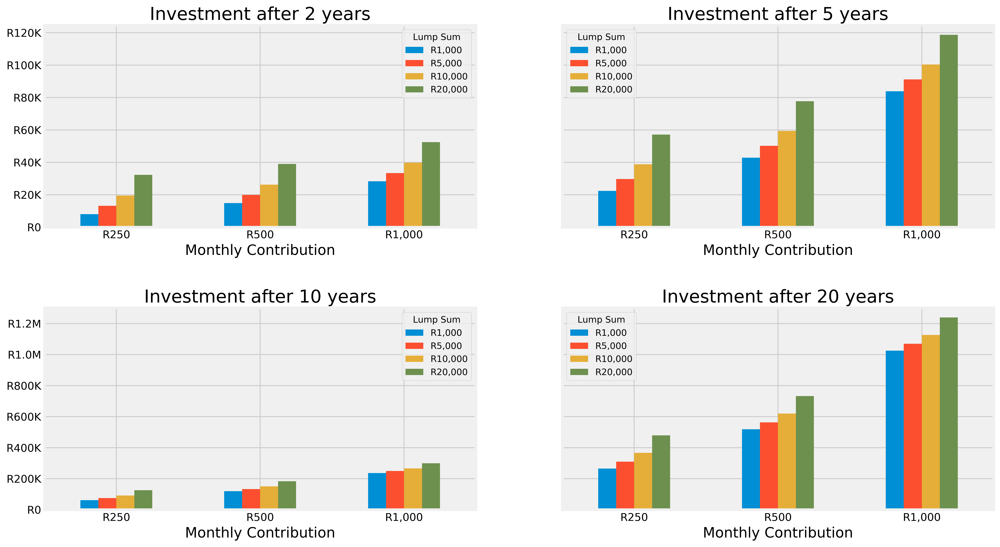

In [43]:

# plt.rcParams['font.family'] = 'serif'
# plt.rcParams['font.serif'] = 'Ubuntu'
# plt.rcParams['font.monospace'] = 'Ubuntu Mono'
# plt.rcParams['font.size'] = 10
# plt.rcParams['axes.labelsize'] = 10
# plt.rcParams['axes.labelweight'] = 'bold'
# plt.rcParams['axes.titlesize'] = 10
# plt.rcParams['xtick.labelsize'] = 8
# plt.rcParams['ytick.labelsize'] = 8
# plt.rcParams['legend.fontsize'] = 10
# plt.rcParams['figure.titlesize'] = 12

horizons = [2, 5, 10, 20]

fig, ax = plt.subplots(2, 2, sharey='row', dpi=400)
width, height = plt.figaspect(1.68)
fig.figsize = (width, height)
fig.subplots_adjust(hspace=0.4)

for ax, horizon in zip(ax.ravel(), horizons):
    ax.yaxis.set_major_formatter(axes_formatter)
    df = data[((data.monthly == 250) | (data.monthly == 500) | (data.monthly == 1000)) & ((data.lump_sum==1000) | (data.lump_sum==5000) | (data.lump_sum==10000) | (data.lump_sum==20000)) & (data.risk == "medium") & (data.horizon == horizon)]
    df.pivot_table(index="monthly", columns="lump_sum", values="fv").plot.bar(figsize=(17, 10), ax=ax)
    ax.set_title("Investment after " + str(horizon) + " years")
    ax.set_xlabel("Monthly Contribution")
    ax.legend(title="Lump Sum", labels=('R1,000', 'R5,000', 'R10,000', 'R20,000'))
    ax.tick_params(axis="x", labelrotation=0)
    ax.set_xticklabels(labels=["R250", "R500", "R1,000"])


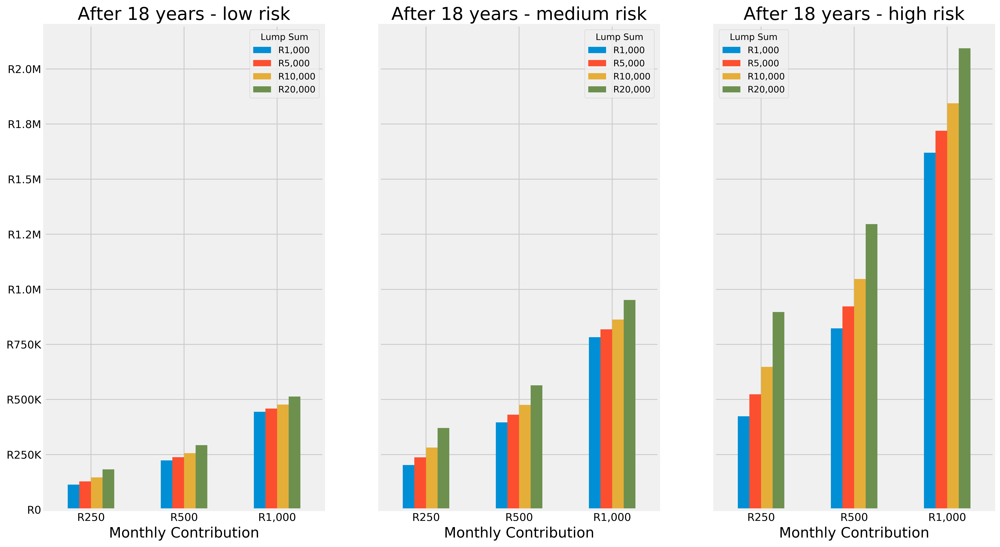

In [44]:

# plt.rcParams['font.family'] = 'serif'
# plt.rcParams['font.serif'] = 'Ubuntu'
# plt.rcParams['font.monospace'] = 'Ubuntu Mono'
# plt.rcParams['font.size'] = 10
# plt.rcParams['axes.labelsize'] = 10
# plt.rcParams['axes.labelweight'] = 'bold'
# plt.rcParams['axes.titlesize'] = 10
# plt.rcParams['xtick.labelsize'] = 8
# plt.rcParams['ytick.labelsize'] = 8
# plt.rcParams['legend.fontsize'] = 10
# plt.rcParams['figure.titlesize'] = 12

risks = ["low", "medium", "high"]

fig, ax = plt.subplots(1, 3, dpi=400, sharey=True)
width, height = plt.figaspect(1.68)
fig.figsize = (width, height)
fig.subplots_adjust(hspace=0.4)

for ax, risk in zip(ax.ravel(), risks):
    ax.yaxis.set_major_formatter(axes_formatter)
    df = data[((data.monthly == 250) | (data.monthly == 500) | (data.monthly == 1000)) & ((data.lump_sum==1000) | (data.lump_sum==5000) | (data.lump_sum==10000) | (data.lump_sum==20000)) & (data.risk == risk) & (data.horizon == 18)]
    df.pivot_table(index="monthly", columns="lump_sum", values="fv").plot.bar(figsize=(17, 10), ax=ax)
    ax.set_title("After 18 years - " + risk + " risk")
    ax.set_xlabel("Monthly Contribution")
    ax.legend(title="Lump Sum", labels=('R1,000', 'R5,000', 'R10,000', 'R20,000'))
    ax.tick_params(axis="x", labelrotation=0)
    ax.set_xticklabels(labels=["R250", "R500", "R1,000"])


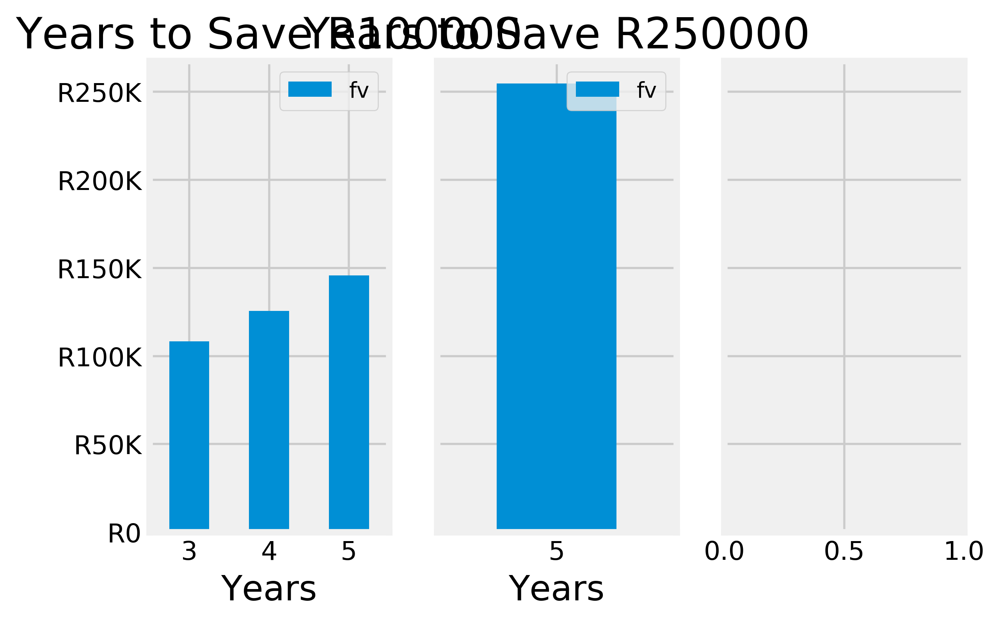

In [45]:
# subplots to show how low it will take to save a certain amount. 
fvs = [100000, 250000, 500000]
years = [2, 5, 10]

fig, ax = plt.subplots(1, 3, dpi=400, sharey='row')
width, height = plt.figaspect(1.68)
fig.figsize = (width, height)
fig.subplots_adjust(hspace=0.4)

for ax, fv in zip(ax.ravel(), fvs):
    ax.yaxis.set_major_formatter(axes_formatter)  
    
    df = data[(data.fv >= fv) & (data.horizon <= 5)].pivot_table(index="horizon", values="fv")
    if df.shape[0] > 0:
        df.plot.bar(ax=ax)
        ax.set_title("Years to Save R" + str(fv))
        ax.set_xlabel("Years")
        ax.tick_params(axis="x", labelrotation=0)

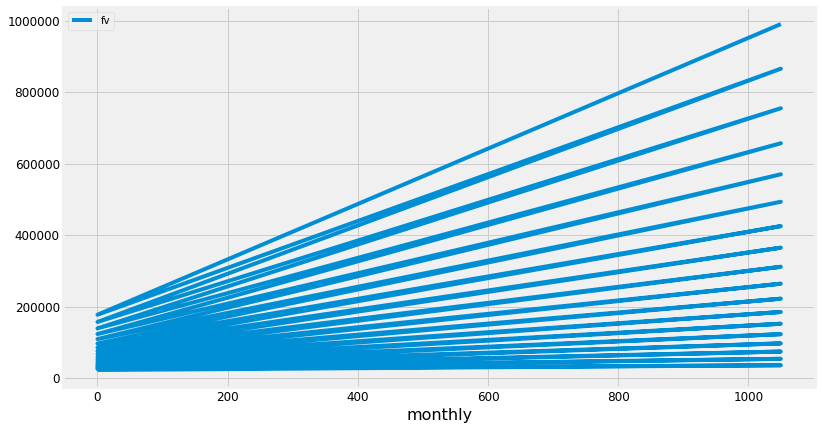

In [46]:
df = data[(data.horizon < 19) & (data.lump_sum == 20000) & (data.risk=="medium")]
df.plot(kind="line", x="monthly", y="fv", figsize=(12, 7))

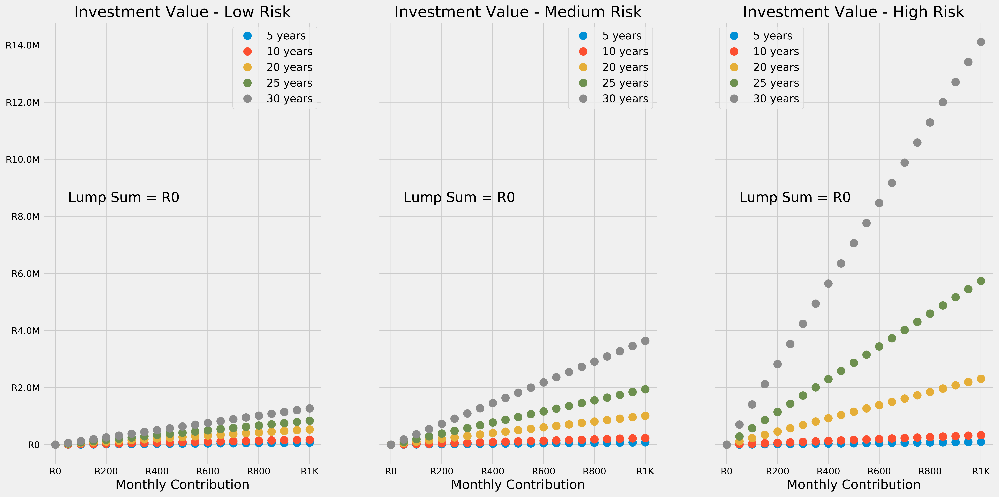

In [47]:
# for a given lump sum, risk rate and horizon, how does increasing the monthly contributions change the fv

plt.style.use('fivethirtyeight')
#plt.style.use('ggplot')

fig, ax = plt.subplots(1, 3, dpi=400, sharey='row', figsize=(20, 10))
fig.subplots_adjust(hspace=0.4)

horizons = (5, 10, 20, 25, 30)
risks = ["low", "medium", "high"]
risks_label = ["Low", "Medium", "High"]

for ax, risk, risk_label in zip(ax.ravel(), risks, risks_label):
    ax.yaxis.set_major_formatter(axes_formatter)
    ax.xaxis.set_major_formatter(axes_formatter)
    
    for horizon in horizons:
        df = data[(data.horizon==horizon) & (data.lump_sum==0) & (data.risk==risk) & (data.monthly <= 1000)]    
        ax.plot(df.monthly, df.fv, label=str(horizon) + " years", marker='o', linestyle='None', markersize=10)        
        ax.set_title("Investment Value - " + risk_label + " Risk")
        ax.set_xlabel("Monthly Contribution")
        ax.tick_params(axis="x", labelrotation=0)
        ax.legend()
        ax.annotate('Lump Sum = R0',
                     xy=(50, 8500000),
                     xytext=(50, 8500000),
                     ha="left",            
                     fontsize=18)

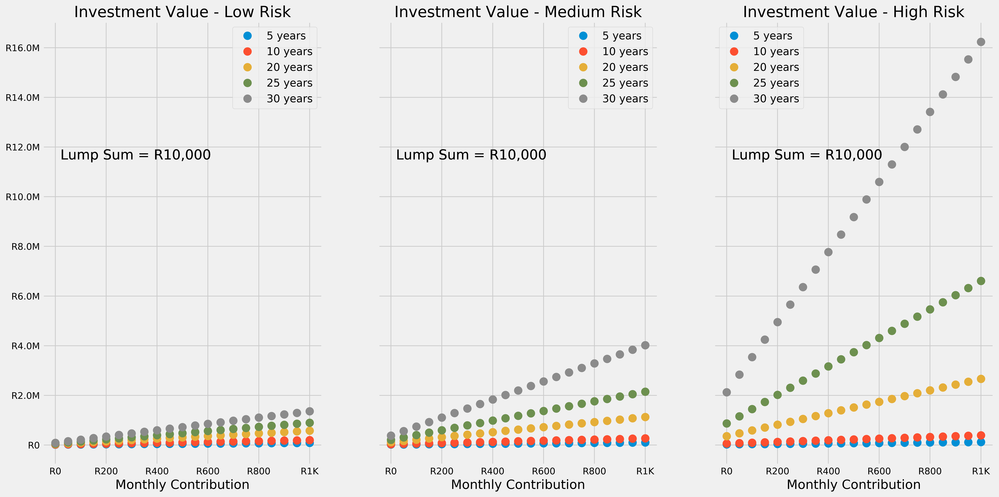

In [48]:
fig, ax = plt.subplots(1, 3, dpi=400, sharey='row', figsize=(20, 10))
fig.subplots_adjust(hspace=0.4)

horizons = (5, 10, 20, 25, 30)
risks = ["low", "medium", "high"]
risks_label = ["Low", "Medium", "High"]

for ax, risk, risk_label in zip(ax.ravel(), risks, risks_label):
    ax.yaxis.set_major_formatter(axes_formatter)
    ax.xaxis.set_major_formatter(axes_formatter)
    
    for horizon in horizons:
        df = data[(data.horizon==horizon) & (data.lump_sum==10000) & (data.risk==risk) & (data.monthly <= 1000)]    
        ax.plot(df.monthly, df.fv, label=str(horizon) + " years", marker='o', linestyle='None', markersize=10)        
        ax.set_title("Investment Value - " + risk_label + " Risk")
        ax.set_xlabel("Monthly Contribution")
        ax.tick_params(axis="x", labelrotation=0)
        ax.legend()
        ax.annotate('Lump Sum = R10,000',
                     xy=(20, 11500000),
                     xytext=(20, 11500000),
                     ha="left",            
                     fontsize=18)

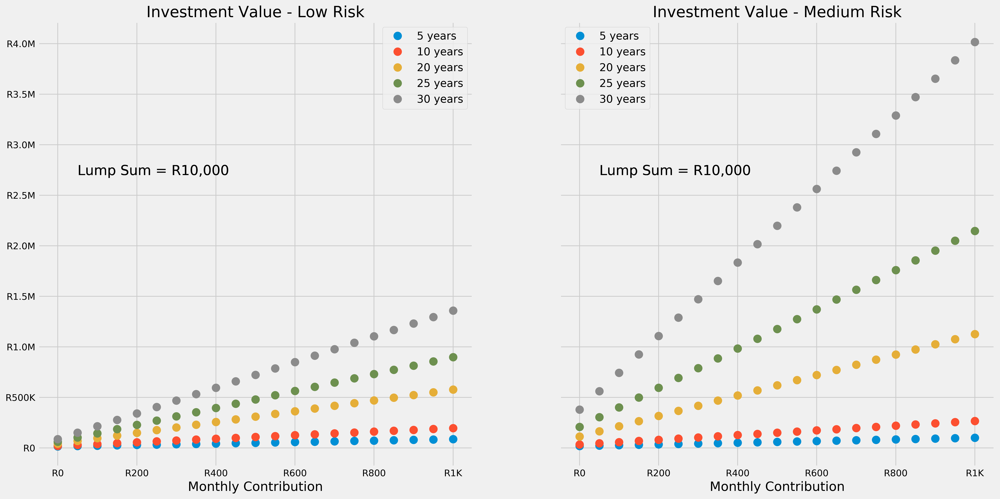

In [49]:
fig, ax = plt.subplots(1, 2, dpi=400, sharey='row', figsize=(20, 10))
fig.subplots_adjust(hspace=0.4)

horizons = (5, 10, 20, 25, 30)
risks = ["low", "medium"]
risks_label = ["Low", "Medium"]

for ax, risk, risk_label in zip(ax.ravel(), risks, risks_label):
    ax.yaxis.set_major_formatter(axes_formatter)
    ax.xaxis.set_major_formatter(axes_formatter)
    
    for horizon in horizons:
        df = data[(data.horizon==horizon) & (data.lump_sum==10000) & (data.risk==risk) & (data.monthly <= 1000)]    
        ax.plot(df.monthly, df.fv, label=str(horizon) + " years", marker='o', linestyle='None', markersize=10)        
        ax.set_title("Investment Value - " + risk_label + " Risk")
        ax.set_xlabel("Monthly Contribution")
        ax.tick_params(axis="x", labelrotation=0)
        ax.legend()
        ax.annotate('Lump Sum = R10,000',
                     xy=(50, 2700000),
                     xytext=(50, 2700000),
                     ha="left",            
                     fontsize=18)

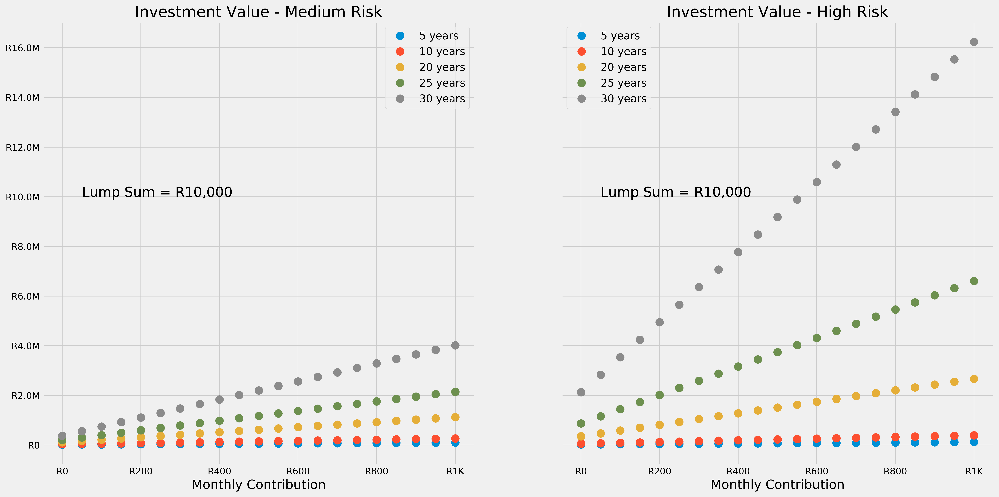

In [50]:
fig, ax = plt.subplots(1, 2, dpi=400, sharey='row', figsize=(20, 10))
fig.subplots_adjust(hspace=0.4)

horizons = (5, 10, 20, 25, 30)
risks = ["medium", "high"]
risks_label = ["Medium", "High"]

for ax, risk, risk_label in zip(ax.ravel(), risks, risks_label):
    ax.yaxis.set_major_formatter(axes_formatter)
    ax.xaxis.set_major_formatter(axes_formatter)
    
    for horizon in horizons:
        df = data[(data.horizon==horizon) & (data.lump_sum==10000) & (data.risk==risk) & (data.monthly <= 1000)]    
        ax.plot(df.monthly, df.fv, label=str(horizon) + " years", marker='o', linestyle='None', markersize=10)        
        ax.set_title("Investment Value - " + risk_label + " Risk")
        ax.set_xlabel("Monthly Contribution")
        ax.tick_params(axis="x", labelrotation=0)
        ax.legend()
        ax.annotate('Lump Sum = R10,000',
                     xy=(50, 10000000),
                     xytext=(50, 10000000),
                     ha="left",            
                     fontsize=18)

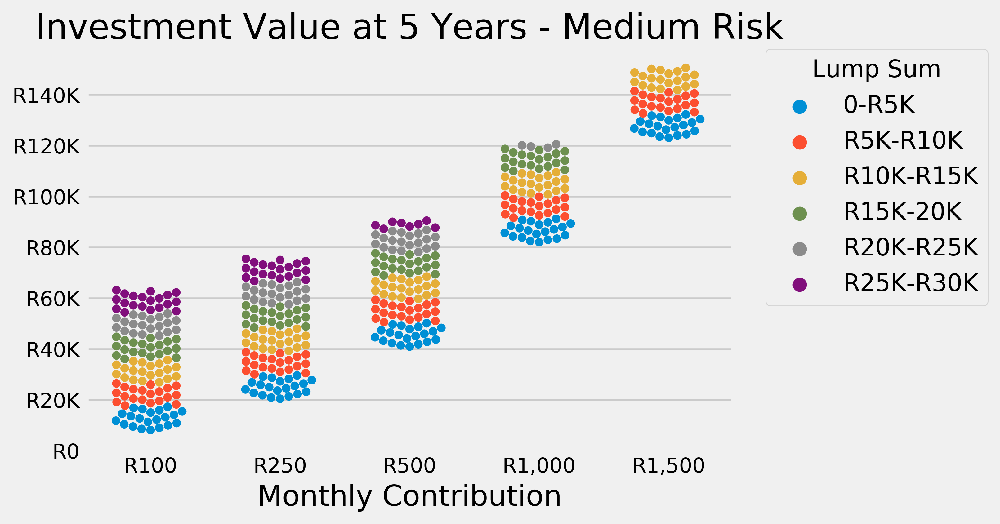

In [51]:
# You havent saved much and you know in 5 years time your daughter might be of that marriage age, what's the best combination to maximise your savings?
plt.style.use('fivethirtyeight')
fig, ax = plt.subplots(1, 1, dpi=400)
width, height = plt.figaspect(1.68)
fig.figsize = (width, height)
fig.subplots_adjust(hspace=0.4)


df = data[(data.horizon==5) & (data.risk=="medium") & ((data.monthly==100) | (data.monthly==250) | (data.monthly==500) | (data.monthly==1000) | (data.monthly==1500))]
ax = sns.swarmplot(x="monthly", y="fv", hue="lump_sum_cat", data=df, ax=ax)
ax.yaxis.set_major_formatter(axes_formatter)
#ax.xaxis.set_major_formatter(both_formatter)
ax.set_ylabel("")
ax.set_xlabel("Monthly Contribution")
ax.set_xticklabels(labels=["R100", "R250", "R500", "R1,000", "R1,500"])
ax.set_title("Investment Value at 5 Years - Medium Risk")
ax.set_ylim(0)

plt.legend(title="Lump Sum", bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

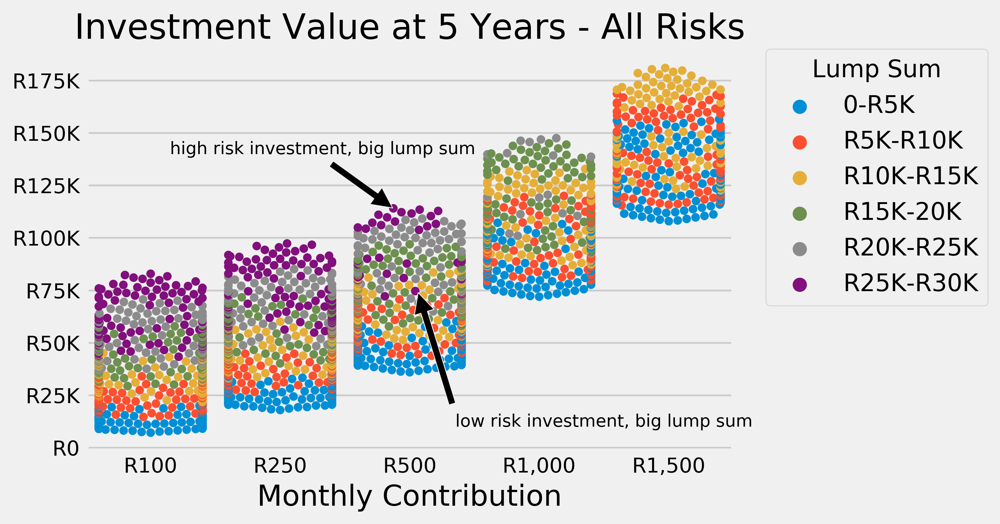

In [52]:
# You havent saved much and you know in 5 years time your daughter might be of that marriage age, what's the best combination to maximise your savings?



plt.style.use('fivethirtyeight')

fig, ax = plt.subplots(1, 1, dpi=400)
width, height = plt.figaspect(1.68)
fig.figsize = (width, height)
fig.subplots_adjust(hspace=0.4)


df = data[(data.horizon==5) & ((data.monthly==100) | (data.monthly==250) | (data.monthly==500) | (data.monthly==1000) | (data.monthly==1500))]
ax = sns.swarmplot(x="monthly", y="fv", hue="lump_sum_cat", data=df, ax=ax)
ax.yaxis.set_major_formatter(axes_formatter)
#ax.xaxis.set_major_formatter(both_formatter)
ax.set_ylabel("")
ax.set_xlabel("Monthly Contribution")
ax.set_xticklabels(labels=["R100", "R250", "R500", "R1,000", "R1,500"])
ax.set_title("Investment Value at 5 Years - All Risks")

ax.annotate('low risk investment, big lump sum',
             xy=(2.05, 77000),
             xytext=(3.5, 10000),
             ha="center",
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=10,
            )

ax.annotate('high risk investment, big lump sum',
             xy=(1.897, 113000),
             xytext=(0.15, 140000),
             ha="left",
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=10,
            )

plt.legend(title="Lump Sum", bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

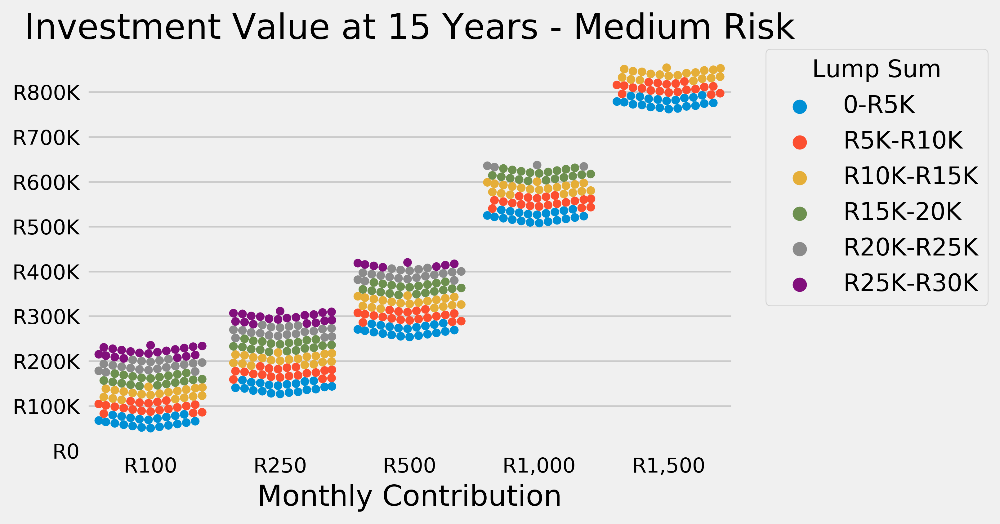

In [53]:
# You havent saved much and you know in 5 years time your daughter might be of that marriage age, what's the best combination to maximise your savings?
plt.style.use('fivethirtyeight')
fig, ax = plt.subplots(1, 1, dpi=400)
width, height = plt.figaspect(1.68)
fig.figsize = (width, height)
fig.subplots_adjust(hspace=0.4)


df = data[(data.horizon==15) & (data.risk=="medium") & ((data.monthly==100) | (data.monthly==250) | (data.monthly==500) | (data.monthly==1000) | (data.monthly==1500))]
ax = sns.swarmplot(x="monthly", y="fv", hue="lump_sum_cat", data=df, ax=ax)
ax.yaxis.set_major_formatter(axes_formatter)
#ax.xaxis.set_major_formatter(both_formatter)
ax.set_ylabel("")
ax.set_xlabel("Monthly Contribution")
ax.set_xticklabels(labels=["R100", "R250", "R500", "R1,000", "R1,500"])
ax.set_title("Investment Value at 15 Years - Medium Risk")
ax.set_ylim(0)

plt.legend(title="Lump Sum", bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

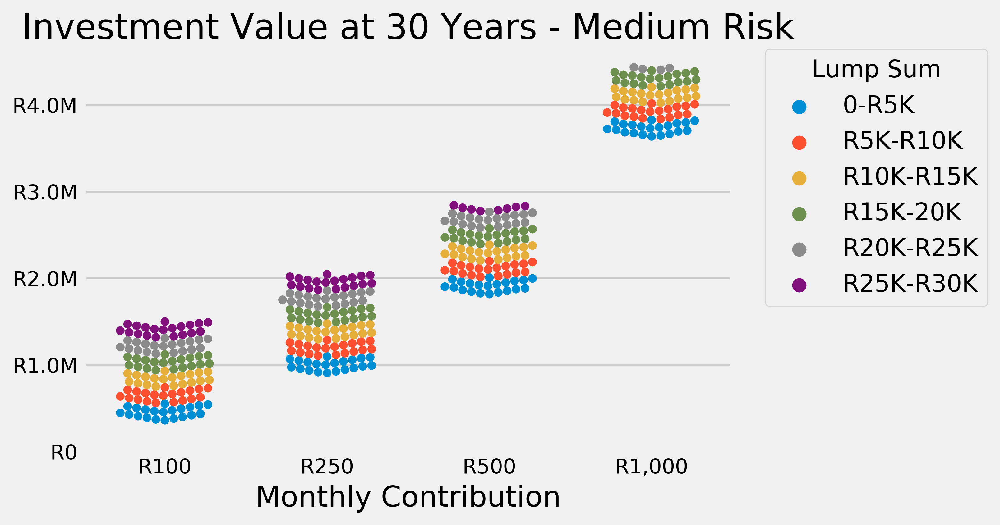

In [54]:
# You havent saved much and you know in 5 years time your daughter might be of that marriage age, what's the best combination to maximise your savings?
plt.style.use('fivethirtyeight')
fig, ax = plt.subplots(1, 1, dpi=400)
width, height = plt.figaspect(1.68)
fig.figsize = (width, height)
fig.subplots_adjust(hspace=0.4)


df = data[(data.horizon==30) & (data.risk=="medium") & ((data.monthly==100) | (data.monthly==250) | (data.monthly==500) | (data.monthly==1000) | (data.monthly==1500))]
ax = sns.swarmplot(x="monthly", y="fv", hue="lump_sum_cat", data=df, ax=ax)
ax.yaxis.set_major_formatter(axes_formatter)
#ax.xaxis.set_major_formatter(both_formatter)
ax.set_ylabel("")
ax.set_xlabel("Monthly Contribution")
ax.set_xticklabels(labels=["R100", "R250", "R500", "R1,000", "R1,500"])
ax.set_title("Investment Value at 30 Years - Medium Risk")
ax.set_ylim(0)


plt.legend(title="Lump Sum", bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

- Over 30 years, contributing R250 per month with a larger deposit equals R500 with no deposit. So which is better, should you save for deposit first and then spend less per month? Let's see....

- If you save for a year, you lose out on earnings for a year, but then you save R250 per month for 30 years. which is better.

In [55]:
mean_250pm_big_lump = round(data[(data.monthly==250) & (data.risk=="medium") & (data.horizon==30) & (data.lump_sum_cat=="R25K-R30K")]["fv"].mean())
contrib_250pm_big_lump = 250*30*12
mean_big_lump = round(data[(data.monthly==250) & (data.risk=="medium") & (data.horizon==30) & (data.lump_sum_cat=="R25K-R30K")]["lump_sum"].mean())


In [56]:
mean_500pm_small_lump = round(data[(data.monthly==500) & (data.risk=="medium") & (data.horizon==30) & (data.lump_sum_cat=="0-R5K")]["fv"].mean())
contrib_500pm_small_lump = 500*30*12
mean_small_lump = round(data[(data.monthly==500) & (data.risk=="medium") & (data.horizon==30) & (data.lump_sum_cat=="0-R5K")]["lump_sum"].mean())


In [57]:
df = pd.DataFrame({'Investment Value': [mean_250pm_big_lump, mean_500pm_small_lump], 'Monthly Contrib': [250, 500], 'Total Monthly Contrib. Over 30 Years': [contrib_250pm_big_lump, contrib_500pm_small_lump], 'Lump Sum': [mean_big_lump, mean_small_lump]})
df

,Investment Value,Monthly Contrib,Total Monthly Contrib. Over 30 Years,Lump Sum
0,1957101,250,90000,27625
1,1913719,500,180000,2500


In [58]:
df["Total Invested (Total Monthly + Lump Sum)"] = df["Total Monthly Contrib. Over 30 Years"] + df["Lump Sum"]
df

,Investment Value,Monthly Contrib,Total Monthly Contrib. Over 30 Years,Lump Sum,Total Invested (Total Monthly + Lump Sum)
0,1957101,250,90000,27625,117625
1,1913719,500,180000,2500,182500


In [59]:
df["Extra Cash on Hand Over 30 Years"] = [500*30*12 - 250*30*12, 0]
df

,Investment Value,Monthly Contrib,Total Monthly Contrib. Over 30 Years,Lump Sum,Total Invested (Total Monthly + Lump Sum),Extra Cash on Hand Over 30 Years
0,1957101,250,90000,27625,117625,90000
1,1913719,500,180000,2500,182500,0


(array([0, 1]), <a list of 2 Text xticklabel objects>)

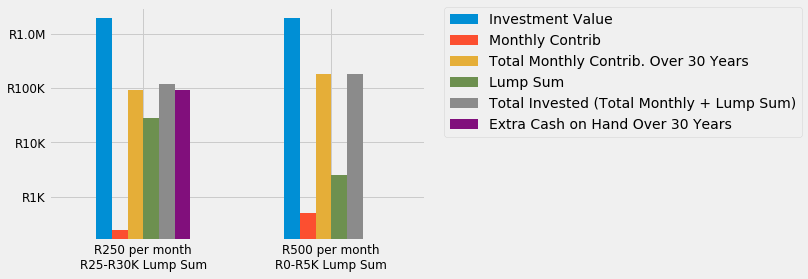

In [60]:
cols = ["Investment Value",  "Total Monthly Contrib. Over 30 Years", "Total Invested", "Extra Cash on Hand Over 30 Years"]
ax = df.plot.bar(logy=True)
ax.set_xticklabels(labels=["R250 per month\nR25-R30K Lump Sum", "R500 per month\nR0-R5K Lump Sum"])
#ax.set_yticklabels(labels=["R1K", "R10K", "R100K", "R1M"])
ax.yaxis.set_major_formatter(axes_formatter)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.xticks(rotation=0)

- Therefore if you have a deposit ready, better to use it and pay less per month. 
- However if you don't have a deposit, then the time it takes to save for one will eat into your long term earnings, although havent shown this.

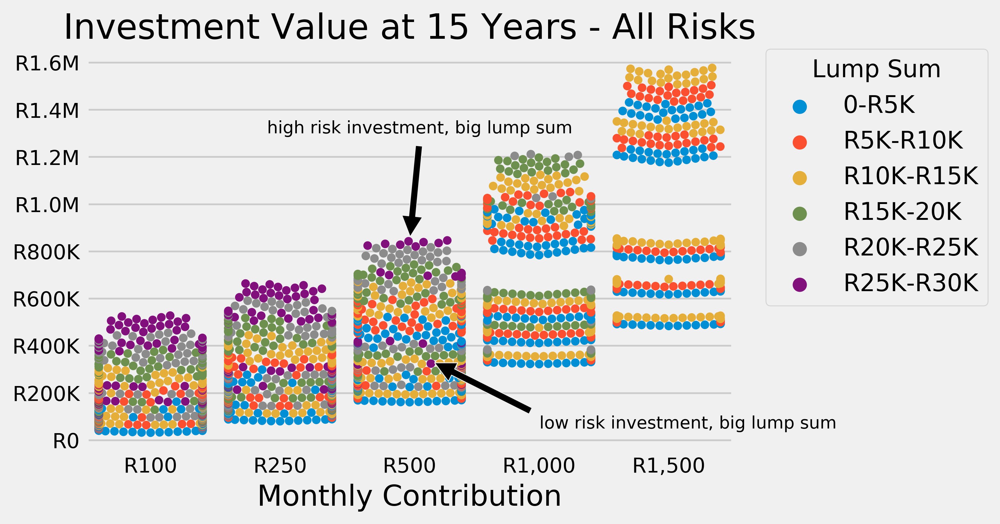

In [61]:
# You havent saved much and you know in 5 years time your daughter might be of that marriage age, what's the best combination to maximise your savings?
plt.style.use('fivethirtyeight')
fig, ax = plt.subplots(1, 1, dpi=400)
width, height = plt.figaspect(1.68)
fig.figsize = (width, height)
fig.subplots_adjust(hspace=0.4)


df = data[(data.horizon==15) & ((data.monthly==100) | (data.monthly==250) | (data.monthly==500) | (data.monthly==1000) | (data.monthly==1500))]
ax = sns.swarmplot(x="monthly", y="fv", hue="lump_sum_cat", data=df, ax=ax)
ax.yaxis.set_major_formatter(axes_formatter)
#ax.xaxis.set_major_formatter(both_formatter)
ax.set_ylabel("")
ax.set_xlabel("Monthly Contribution")
ax.set_xticklabels(labels=["R100", "R250", "R500", "R1,000", "R1,500"])
ax.set_title("Investment Value at 15 Years - All Risks")

ax.annotate('low risk investment, big lump sum',
             #xy=(550, 400000),
             #xytext=(600, 150000),
             xy=(2.15, 340000),
             xytext=(4.15, 50000),
             ha="center",
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=10,
            )

ax.annotate('high risk investment, big lump sum',
             #xy=(550, 400000),
             #xytext=(600, 150000),
             xy=(2, 840000),
             xytext=(0.9, 1300000),
             ha="left",
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=10,
            )


plt.legend(title="Lump Sum", bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [62]:
# Best way to get to R500,000

target=500000
data[data.fv >= target]

,horizon,rate,lump_sum,monthly,risk,valid,fv,horizon_cat,lump_sum_cat,monthly_cat
122260,11,0.0721,0,2500,low,True,5.013864e+05,15 Years,0-R5K,R2K-R2.5K
122261,11,0.0721,0,2550,low,True,5.114141e+05,15 Years,0-R5K,R2K-R2.5K
122262,11,0.0721,0,2600,low,True,5.214419e+05,15 Years,0-R5K,R2K-R2.5K
122263,11,0.0721,0,2650,low,True,5.314696e+05,15 Years,0-R5K,R2K-R2.5K
122264,11,0.0721,0,2700,low,True,5.414973e+05,15 Years,0-R5K,R2K-R2.5K
122265,11,0.0721,0,2750,low,True,5.515250e+05,15 Years,0-R5K,R2K-R2.5K
122361,11,0.0721,250,2500,low,True,5.019377e+05,15 Years,0-R5K,R2K-R2.5K
122362,11,0.0721,250,2550,low,True,5.119654e+05,15 Years,0-R5K,R2K-R2.5K
122363,11,0.0721,250,2600,low,True,5.219931e+05,15 Years,0-R5K,R2K-R2.5K
122364,11,0.0721,250,2650,low,True,5.320208e+05,15 Years,0-R5K,R2K-R2.5K


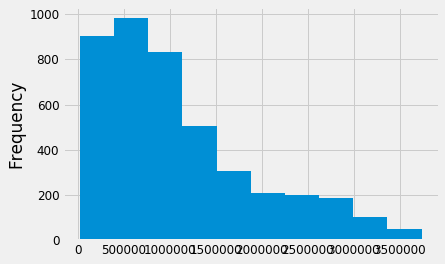

In [63]:
data[(data.horizon==18) & (data.lump_sum_cat=="R5K-R10K")]["fv"].plot.hist()

In [64]:
df = data[(data.horizon == 18) & (data.lump_sum <= 30000)]

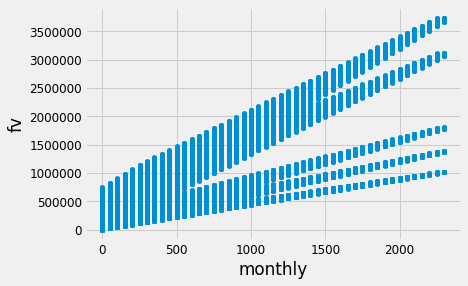

In [65]:
df.plot.scatter(x="monthly", y="fv")

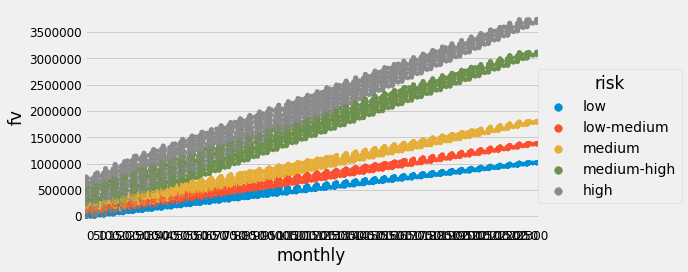

In [66]:
g = sns.factorplot(x="monthly", y="fv", hue="risk", data=df, kind="swarm", 
                   size=4, aspect=2);

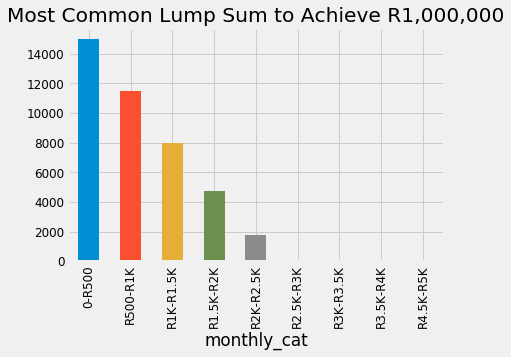

In [67]:
df = data[(data.fv > 900000) & (data.fv <= 1100000)]
df.pivot_table(index="monthly_cat", aggfunc=["mean", "median", "count"])["median"]["lump_sum"].plot.bar(title="Most Common Lump Sum to Achieve R1,000,000")

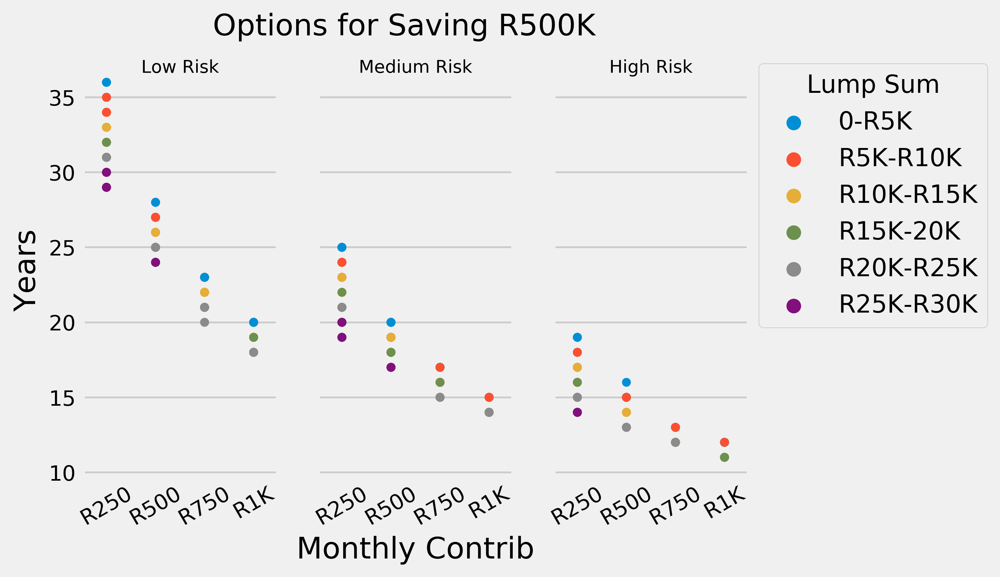

In [68]:
risks = ["low", "medium", "high"]
risk_labels = ["Low", "Medium", "High"]

fig, ax = plt.subplots(1, 3, dpi=400, sharey='row', sharex=True)
width, height = plt.figaspect(1.68)
fig.figsize = (width, height)
fig.subplots_adjust(hspace=0.4)

for ax, risk, risk_label in zip(ax.ravel(), risks, risk_labels):
    df = data[(data.risk==risk) & ((data.fv>=500000) & (data.fv<=550000)) & ((data.monthly==250) | (data.monthly==500) | (data.monthly==750) | (data.monthly==1000))]
    ax = sns.stripplot(x="monthly", y="horizon", hue="lump_sum_cat", data=df, ax=ax)
    
    
    if risk == "low":        
        #ax.set_xlabel("Monthly Contrib")
        ax.set_ylabel("Years")
    else:
        ax.set_ylabel("")
    
    if risk == "medium":
        ax.set_xlabel("Monthly Contrib")
    else:
        ax.set_xlabel("")
    ax.tick_params(axis="x", labelrotation=30)
    ax.set_xticklabels(labels=["R250", "R500", "R750", "R1K"])
    ax.set_title(risk_label + " Risk", pad=-5, fontdict={"fontsize": 10})
    #ax.xaxis.set_major_formatter(both_formatter) 
    handles, labels = ax.get_legend_handles_labels()
    ax.legend().set_visible(False)
    

plt.suptitle("Options for Saving R500K")
plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., title="Lump Sum")

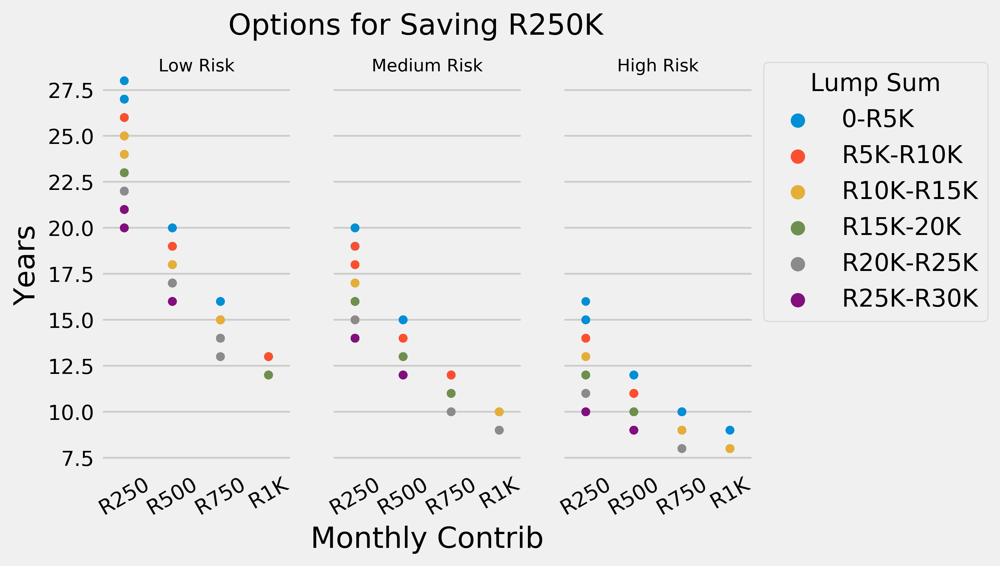

In [69]:
risks = ["low", "medium", "high"]
risk_labels = ["Low", "Medium", "High"]

fig, ax = plt.subplots(1, 3, dpi=400, sharey='row', sharex=True)
width, height = plt.figaspect(1.68)
fig.figsize = (width, height)
fig.subplots_adjust(hspace=0.4)

for ax, risk, risk_label in zip(ax.ravel(), risks, risk_labels):
    df = data[(data.risk==risk) & ((data.fv>=250000) & (data.fv<=275000)) & ((data.monthly==250) | (data.monthly==500) | (data.monthly==750) | (data.monthly==1000))]
    ax = sns.stripplot(x="monthly", y="horizon", hue="lump_sum_cat", data=df, ax=ax)
    
    
    if risk == "low":        
        #ax.set_xlabel("Monthly Contrib")
        ax.set_ylabel("Years")
    else:
        ax.set_ylabel("")
    
    if risk == "medium":
        ax.set_xlabel("Monthly Contrib")
    else:
        ax.set_xlabel("")
    ax.tick_params(axis="x", labelrotation=30)
    ax.set_xticklabels(labels=["R250", "R500", "R750", "R1K"])
    ax.set_title(risk_label + " Risk", pad=-5, fontdict={"fontsize": 10})
    #ax.xaxis.set_major_formatter(both_formatter) 
    handles, labels = ax.get_legend_handles_labels()
    ax.legend().set_visible(False)
    

plt.suptitle("Options for Saving R250K")
plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., title="Lump Sum")

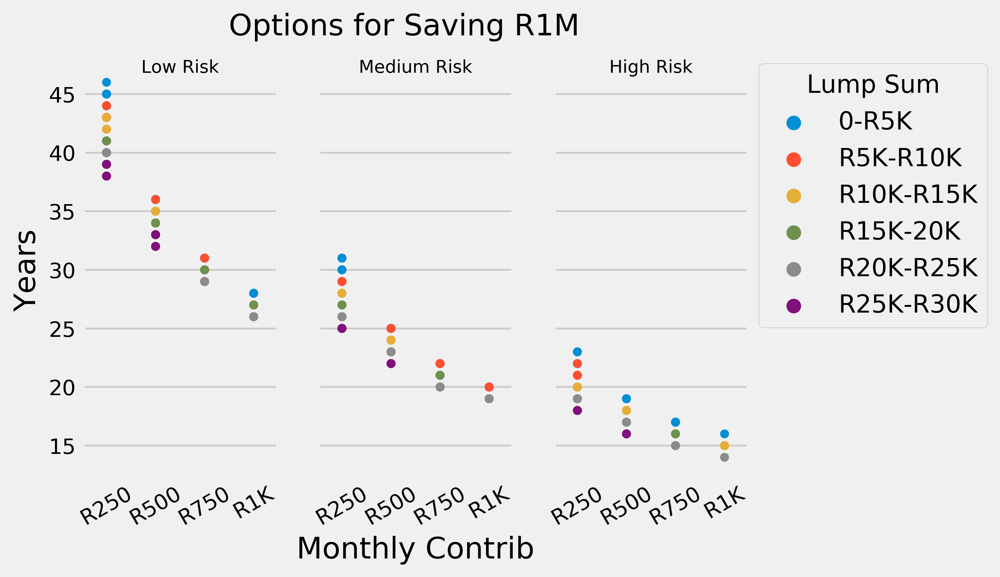

In [70]:
risks = ["low", "medium", "high"]
risk_labels = ["Low", "Medium", "High"]

fig, ax = plt.subplots(1, 3, dpi=400, sharey='row', sharex=True)
width, height = plt.figaspect(1.68)
fig.figsize = (width, height)
fig.subplots_adjust(hspace=0.4)

for ax, risk, risk_label in zip(ax.ravel(), risks, risk_labels):
    df = data[(data.risk==risk) & ((data.fv>=1000000) & (data.fv<=1100000)) & ((data.monthly==250) | (data.monthly==500) | (data.monthly==750) | (data.monthly==1000))]
    ax = sns.stripplot(x="monthly", y="horizon", hue="lump_sum_cat", data=df, ax=ax)
    
    
    if risk == "low":        
        #ax.set_xlabel("Monthly Contrib")
        ax.set_ylabel("Years")
    else:
        ax.set_ylabel("")
    
    if risk == "medium":
        ax.set_xlabel("Monthly Contrib")
    else:
        ax.set_xlabel("")
    ax.tick_params(axis="x", labelrotation=30)
    ax.set_xticklabels(labels=["R250", "R500", "R750", "R1K"])
    ax.set_title(risk_label + " Risk", pad=-5, fontdict={"fontsize": 10})
    #ax.xaxis.set_major_formatter(both_formatter) 
    handles, labels = ax.get_legend_handles_labels()
    ax.legend().set_visible(False)
    

plt.suptitle("Options for Saving R1M")
plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., title="Lump Sum")

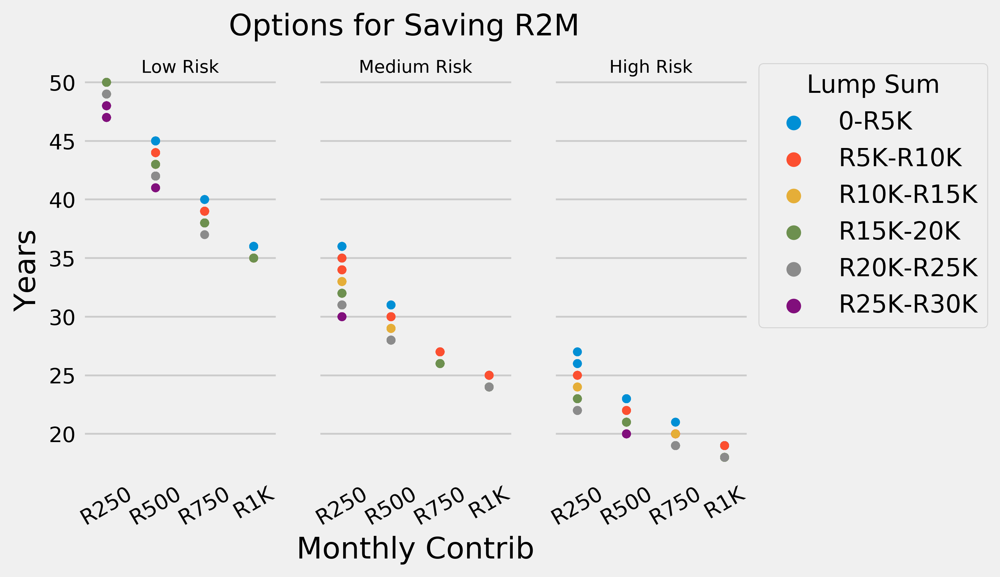

In [71]:
risks = ["low", "medium", "high"]
risk_labels = ["Low", "Medium", "High"]

fig, ax = plt.subplots(1, 3, dpi=400, sharey='row', sharex=True)
width, height = plt.figaspect(1.68)
fig.figsize = (width, height)
fig.subplots_adjust(hspace=0.4)

for ax, risk, risk_label in zip(ax.ravel(), risks, risk_labels):
    df = data[(data.risk==risk) & ((data.fv>=2000000) & (data.fv<=2100000)) & ((data.monthly==250) | (data.monthly==500) | (data.monthly==750) | (data.monthly==1000))]
    ax = sns.stripplot(x="monthly", y="horizon", hue="lump_sum_cat", data=df, ax=ax)
    
    
    if risk == "low":        
        #ax.set_xlabel("Monthly Contrib")
        ax.set_ylabel("Years")
    else:
        ax.set_ylabel("")
    
    if risk == "medium":
        ax.set_xlabel("Monthly Contrib")
    else:
        ax.set_xlabel("")
    ax.tick_params(axis="x", labelrotation=30)
    ax.set_xticklabels(labels=["R250", "R500", "R750", "R1K"])
    ax.set_title(risk_label + " Risk", pad=-5, fontdict={"fontsize": 10})
    #ax.xaxis.set_major_formatter(both_formatter) 
    handles, labels = ax.get_legend_handles_labels()
    ax.legend().set_visible(False)
    

plt.suptitle("Options for Saving R2M")
plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., title="Lump Sum")

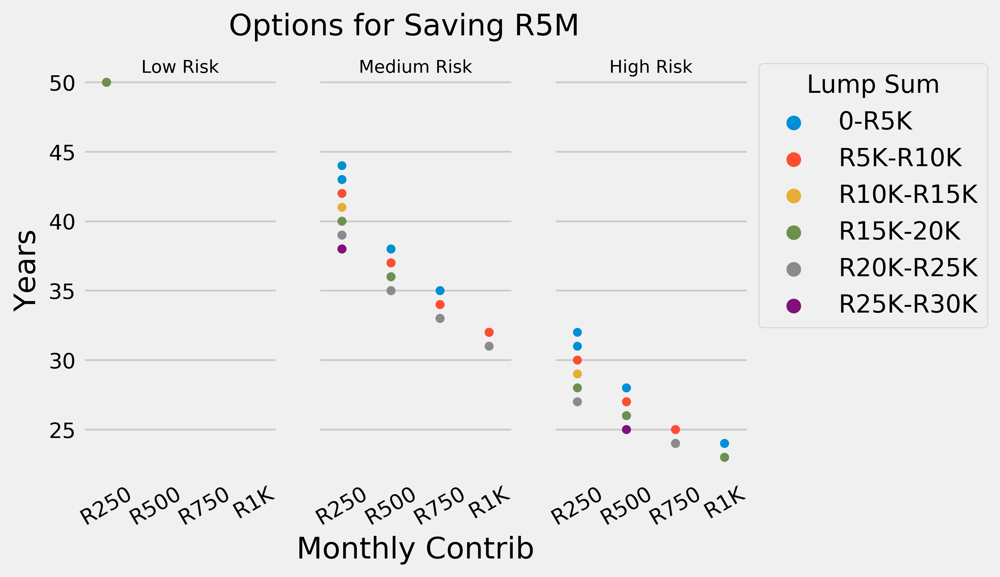

In [72]:
risks = ["low", "medium", "high"]
risk_labels = ["Low", "Medium", "High"]

fig, ax = plt.subplots(1, 3, dpi=400, sharey='row', sharex=True)
width, height = plt.figaspect(1.68)
fig.figsize = (width, height)
fig.subplots_adjust(hspace=0.4)

for ax, risk, risk_label in zip(ax.ravel(), risks, risk_labels):
    df = data[(data.risk==risk) & ((data.fv>=5000000) & (data.fv<=5100000)) & ((data.monthly==250) | (data.monthly==500) | (data.monthly==750) | (data.monthly==1000))]
    ax = sns.stripplot(x="monthly", y="horizon", hue="lump_sum_cat", data=df, ax=ax)
    
    
    if risk == "low":        
        #ax.set_xlabel("Monthly Contrib")
        ax.set_ylabel("Years")
    else:
        ax.set_ylabel("")
    
    if risk == "medium":
        ax.set_xlabel("Monthly Contrib")
    else:
        ax.set_xlabel("")
    ax.tick_params(axis="x", labelrotation=30)
    ax.set_xticklabels(labels=["R250", "R500", "R750", "R1K"])
    ax.set_title(risk_label + " Risk", pad=-5, fontdict={"fontsize": 10})
    #ax.xaxis.set_major_formatter(both_formatter) 
    handles, labels = ax.get_legend_handles_labels()
    ax.legend().set_visible(False)
    

plt.suptitle("Options for Saving R5M")
plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., title="Lump Sum")

C:\Users\doron\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:3124: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=-0.5, right=-0.5
  'left=%s, right=%s') % (left, right))


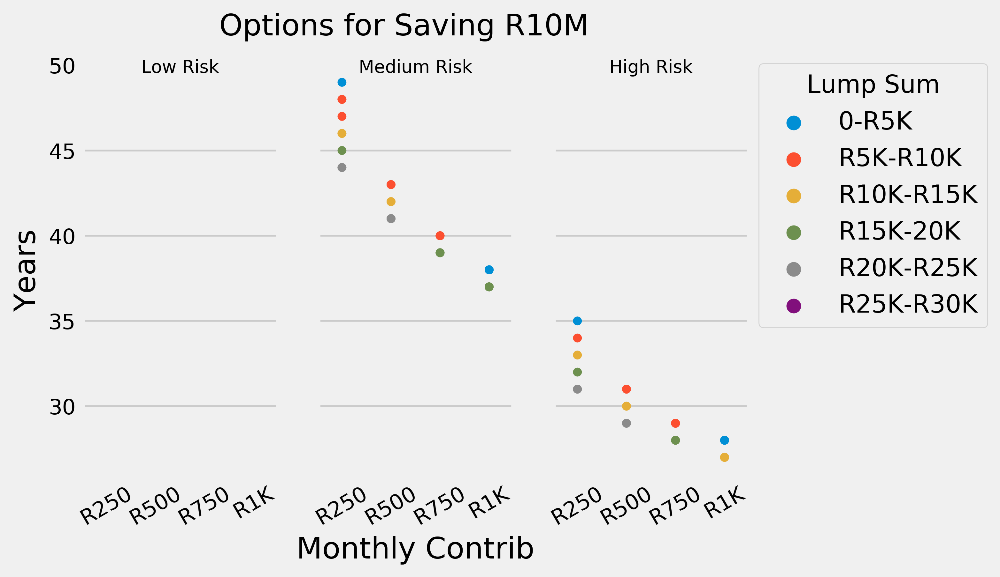

In [73]:
risks = ["low", "medium", "high"]
risk_labels = ["Low", "Medium", "High"]

fig, ax = plt.subplots(1, 3, dpi=400, sharey='row', sharex=True)
width, height = plt.figaspect(1.68)
fig.figsize = (width, height)
fig.subplots_adjust(hspace=0.4)

for ax, risk, risk_label in zip(ax.ravel(), risks, risk_labels):
    df = data[(data.risk==risk) & ((data.fv>=10000000) & (data.fv<=10100000)) & ((data.monthly==250) | (data.monthly==500) | (data.monthly==750) | (data.monthly==1000))]
    ax = sns.stripplot(x="monthly", y="horizon", hue="lump_sum_cat", data=df, ax=ax)
    
    
    if risk == "low":        
        #ax.set_xlabel("Monthly Contrib")
        ax.set_ylabel("Years")
    else:
        ax.set_ylabel("")
    
    if risk == "medium":
        ax.set_xlabel("Monthly Contrib")
    else:
        ax.set_xlabel("")
    ax.tick_params(axis="x", labelrotation=30)
    ax.set_xticklabels(labels=["R250", "R500", "R750", "R1K"])
    ax.set_title(risk_label + " Risk", pad=-5, fontdict={"fontsize": 10})
    #ax.xaxis.set_major_formatter(both_formatter) 
    handles, labels = ax.get_legend_handles_labels()
    ax.legend().set_visible(False)
    

plt.suptitle("Options for Saving R10M")
plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., title="Lump Sum")

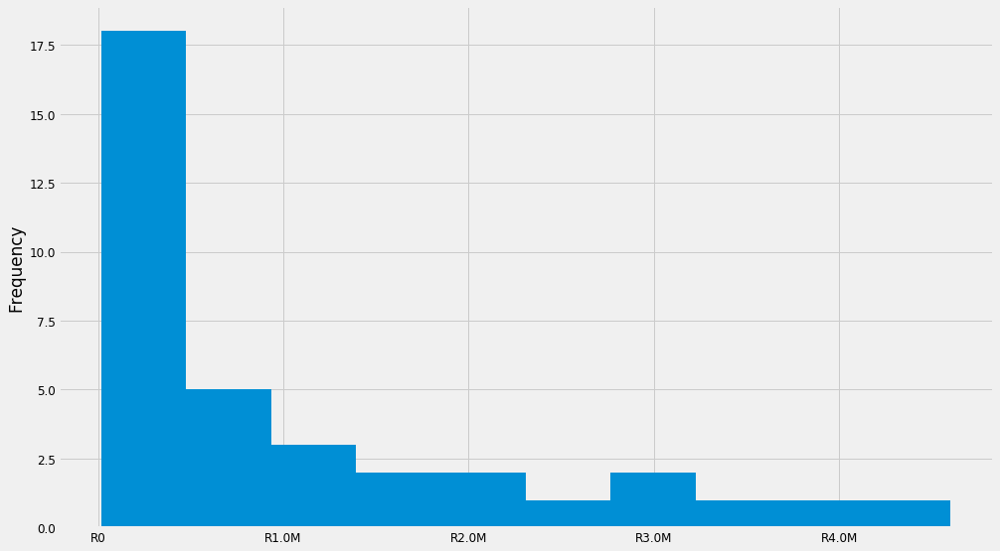

In [84]:
ax = data[(data.lump_sum == 10000) & (data.monthly == 500) & (data.risk == "medium") & (data.fv <= 5000000)].fv.plot.hist(figsize=(15, 9))
ax.xaxis.set_major_formatter(axes_formatter)

# Next Steps
- Take investment fees into account
- Simulate putting extra money into investment in random months/years
- Simulate a market going up and down